In [1]:
# импорт требуемых библиотек
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from matplotlib import rcParams
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor 
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [2]:
# Определение коэффициента RANDOM_STATE для повторяемости результатов
RANDOM_STATE = 42

# 1. Загрузка данных и формирование рабочего датасета

## 1.1 Загрузка файлов

In [3]:
# загрузка файлов для локальной работы
#
#X_nup_df = pd.read_excel('C:\Download\X_nup.xlsx', sheet_name = 'X_nup.csv')
#X_bp_df = pd.read_excel('C:\Download\X_bp.xlsx', sheet_name = 'X_bp.csv')
#----------------------------------------------------------------------------
# загрузка файлов для Google Colab
#
# чтение данных из xls-файла в переменную x_bp
x_bp = pd.read_excel('X_bp.xlsx', sheet_name = 'X_bp.csv', index_col=0)
x_bp
# в таблице 1023 строк и 11 столбцов, включая индекс

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000
1.0,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000
2.0,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000
3.0,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000
4.0,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000
...,...,...,...,...,...,...,...,...,...,...
1018.0,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019.0,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020.0,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021.0,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [4]:
x_nup = pd.read_excel('X_nup.xlsx', sheet_name = 'X_nup.csv', index_col=0)
x_nup
# в таблице 1040 строк и 4 столбца, включая индекс

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.000000,57.000000
1.0,0.0,4.000000,60.000000
2.0,0.0,4.000000,70.000000
3.0,0.0,5.000000,47.000000
4.0,0.0,5.000000,57.000000
...,...,...,...
1035.0,90.0,8.088111,47.759177
1036.0,90.0,7.619138,66.931932
1037.0,90.0,9.800926,72.858286
1038.0,90.0,10.079859,65.519479


## 1.2 Объединение в одну таблицу

* Объединение таблиц производится по пересечению таблиц (inner), т.е. строки из файла x_nup, у которых нет индекса в файле x_bp (17 строк), будут отброшены.

In [5]:
# функции pd.merge и df.join - объединение таблиц по вертикали путем выполнения операций слияния баз данных.
df = x_bp.join(x_nup, how='inner', lsuffix='_left', rsuffix='_right')
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
1.0,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
2.0,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000
3.0,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4.0,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018.0,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019.0,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020.0,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021.0,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


# 2. Разведочный анализ данных

## 2.1 Количественная информация о данных

In [6]:
# частота повторов одних и тех де значений в каждом параметре набора данных
feature_names = df.columns.tolist()
for column in feature_names:
  print (column)
  print (df[column].value_counts(dropna=False))

Соотношение матрица-наполнитель
1.857143    4
3.532338    2
1.598174    2
2.877358    2
2.919678    2
           ..
4.275325    1
2.908835    1
2.661267    1
3.324730    1
3.808020    1
Name: Соотношение матрица-наполнитель, Length: 1014, dtype: int64
Плотность, кг/м3
2030.000000    6
2000.000000    2
1980.000000    2
1950.000000    2
1880.000000    2
              ..
1888.349132    1
1894.104387    1
2150.793053    1
1948.878616    1
1890.413468    1
Name: Плотность, кг/м3, Length: 1013, dtype: int64
модуль упругости, ГПа
738.736842    4
609.497976    1
593.264606    1
354.752402    1
694.430768    1
             ..
546.816051    1
730.830981    1
923.084499    1
891.784985    1
417.316232    1
Name: модуль упругости, ГПа, Length: 1020, dtype: int64
Количество отвердителя, м.%
129.000000    12
111.860000     8
30.000000      1
116.396208     1
137.983837     1
              ..
109.246571     1
62.743272      1
119.924425     1
122.273222     1
129.183416     1
Name: Количество отверди

In [7]:
# перечень параметров датасета
df.columns.tolist()

['Соотношение матрица-наполнитель',
 'Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа',
 'Прочность при растяжении, МПа',
 'Потребление смолы, г/м2',
 'Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки']

In [8]:
# количество непропущенных наблюдений и типы переменных
df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1023 entries, 0.0 to 1022.0
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   float64
 11  Шаг нашивки

* В наборе данных 13 параметров и 1023 ненулевых значений по каждому параметру. Пропущенных наблюдений (нулевых значений) нет. Все параметры численные.

In [9]:
# количество уникальных значений по каждому параметру
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [10]:
# количество пропусков
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [11]:
# количество дубликатов - их нет
df.duplicated().sum()

0

### Описательная статистика по каждому параметру

In [12]:
# описательная статистика
df.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.93,0.91,0.39,2.32,2.91,3.55,5.59
"Плотность, кг/м3",1023.0,1975.73,73.73,1731.76,1924.16,1977.62,2021.37,2207.77
"модуль упругости, ГПа",1023.0,739.92,330.23,2.44,500.05,739.66,961.81,1911.54
"Количество отвердителя, м.%",1023.0,110.57,28.30,17.74,92.44,110.56,129.73,198.95
"Содержание эпоксидных групп,%_2",1023.0,22.24,2.41,14.25,20.61,22.23,23.96,33.00
"Температура вспышки, С_2",1023.0,285.88,40.94,100.00,259.07,285.90,313.00,413.27
"Поверхностная плотность, г/м2",1023.0,482.73,281.31,0.60,266.82,451.86,693.23,1399.54
"Модуль упругости при растяжении, ГПа",1023.0,73.33,3.12,64.05,71.25,73.27,75.36,82.68
"Прочность при растяжении, МПа",1023.0,2466.92,485.63,1036.86,2135.85,2459.52,2767.19,3848.44
"Потребление смолы, г/м2",1023.0,218.42,59.74,33.80,179.63,219.20,257.48,414.59


## 2.2 Графическая информация

### Гистограммы

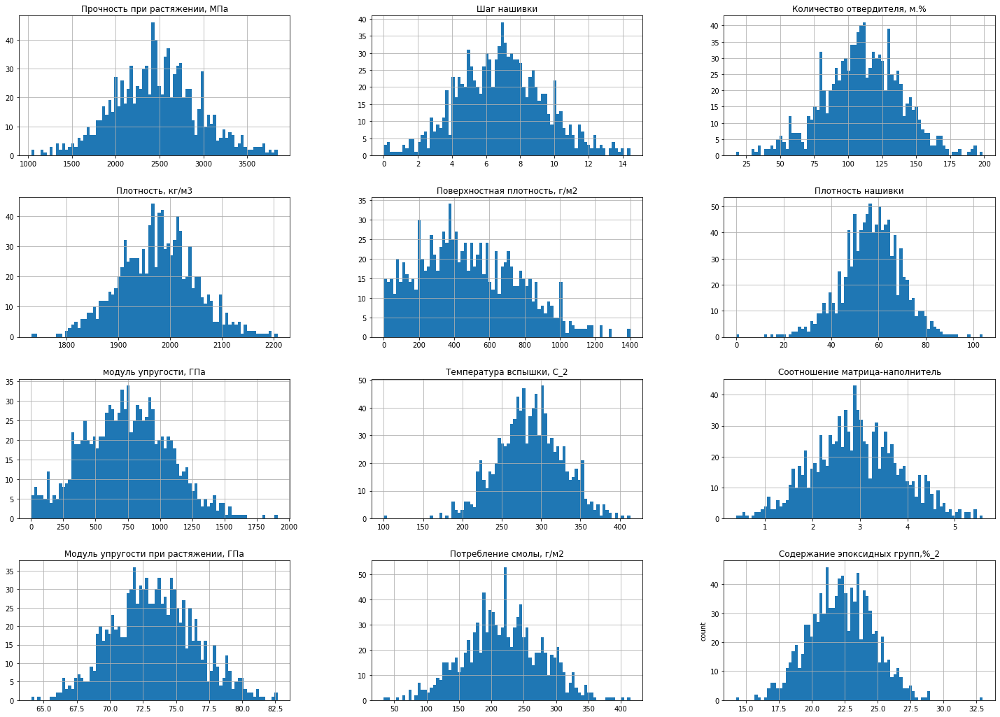

In [13]:
# по Углу нашивки не строится (2 значения)
features = list(set(df.columns) - set(['Угол нашивки, град']))
picture = df[features].hist(figsize=(25,18), bins=80);
plt.ylabel("count")
plt.savefig('histogram.png', dpi=300, bbox_inches='tight')

### Диаграммы размаха, или "ящик с усами"

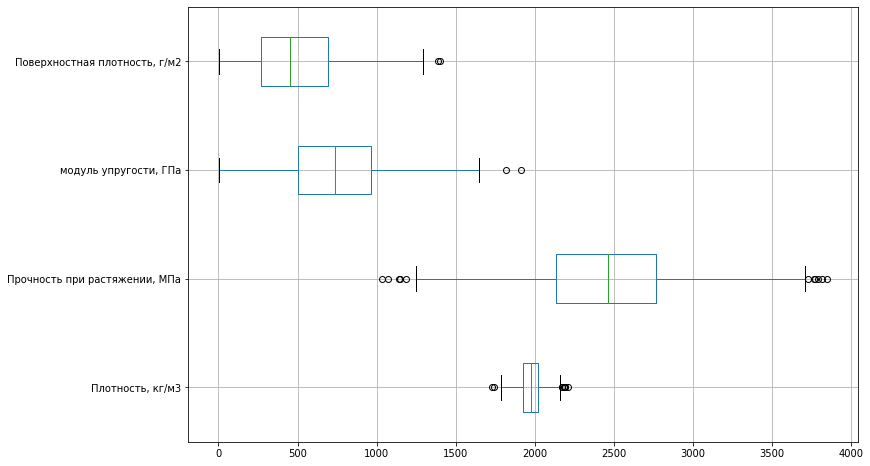

In [14]:
# группировка ящиков на один рисунок в зависимости от масштаба значений переменных
boxplot1 = df.boxplot(column=['Плотность, кг/м3', 'Прочность при растяжении, МПа', 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2'], figsize=(12,8), vert=False)
plt.savefig('boxplot1.png', dpi=300, bbox_inches='tight')

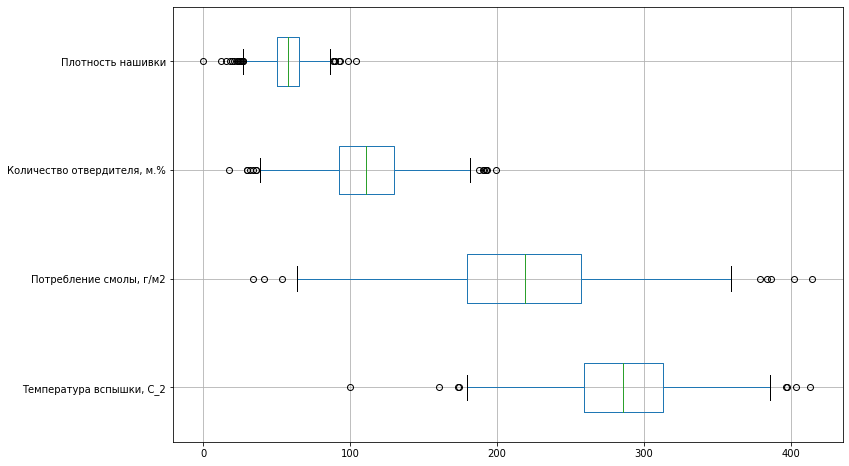

In [15]:
boxplot2 = df.boxplot(column=['Температура вспышки, С_2', 'Потребление смолы, г/м2','Количество отвердителя, м.%', 'Плотность нашивки'], figsize=(12,8), vert=False)
plt.savefig('boxplot2.png', dpi=300, bbox_inches='tight')

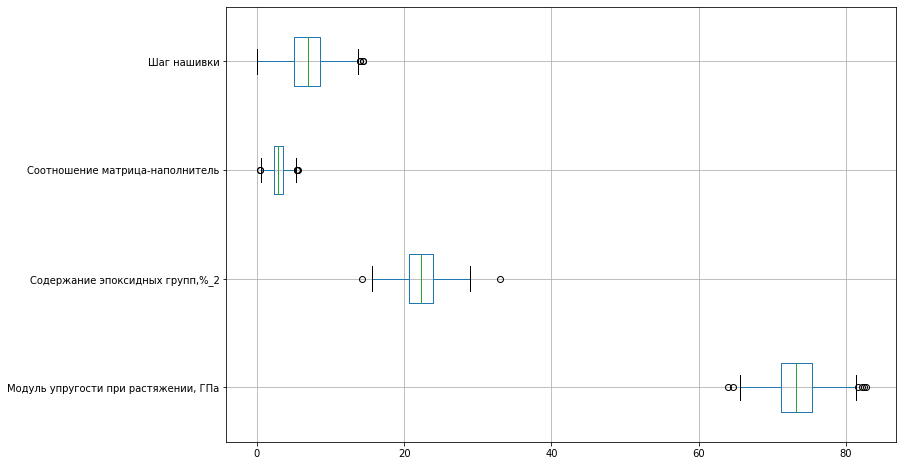

In [16]:
boxplot3 = df.boxplot(column=['Модуль упругости при растяжении, ГПа', 'Содержание эпоксидных групп,%_2', 'Соотношение матрица-наполнитель', 'Шаг нашивки'], figsize=(12,8), vert=False)
plt.savefig('boxplot3.png', dpi=300, bbox_inches='tight')

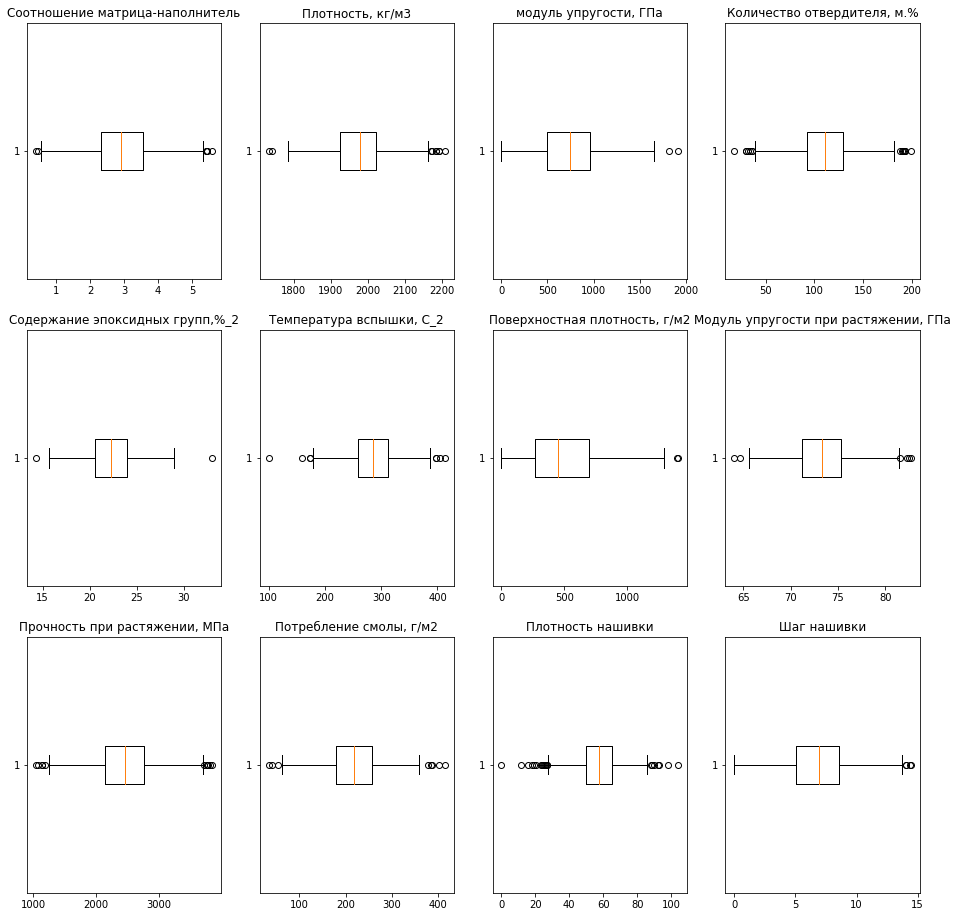

In [17]:
# все диаграммы на один рисунок
fig, axs = plt.subplots(3, 4, figsize=(16, 16))
plt.rcParams.update({'font.size': 10})
axs[0, 0].boxplot(df['Соотношение матрица-наполнитель'], vert=False)
axs[0, 0].set_title('Соотношение матрица-наполнитель')
axs[0, 1].boxplot(df['Плотность, кг/м3'], vert=False)
axs[0, 1].set_title('Плотность, кг/м3')
axs[0, 2].boxplot(df['модуль упругости, ГПа'], vert=False)
axs[0, 2].set_title('модуль упругости, ГПа')
axs[0, 3].boxplot(df['Количество отвердителя, м.%'], vert=False)
axs[0, 3].set_title('Количество отвердителя, м.%')
axs[1, 0].boxplot(df['Содержание эпоксидных групп,%_2'], vert=False)
axs[1, 0].set_title('Содержание эпоксидных групп,%_2')
axs[1, 1].boxplot(df['Температура вспышки, С_2'], vert=False)
axs[1, 1].set_title('Температура вспышки, С_2')
axs[1, 2].boxplot(df['Поверхностная плотность, г/м2'], vert=False)
axs[1, 2].set_title('Поверхностная плотность, г/м2')
axs[1, 3].boxplot(df['Модуль упругости при растяжении, ГПа'], vert=False)
axs[1, 3].set_title('Модуль упругости при растяжении, ГПа')
axs[2, 0].boxplot(df['Прочность при растяжении, МПа'], vert=False)
axs[2, 0].set_title('Прочность при растяжении, МПа')
axs[2, 1].boxplot(df['Потребление смолы, г/м2'], vert=False)
axs[2, 1].set_title('Потребление смолы, г/м2')
axs[2, 2].boxplot(df['Плотность нашивки'], vert=False)
axs[2, 2].set_title('Плотность нашивки')
axs[2, 3].boxplot(df['Шаг нашивки'], vert=False)
axs[2, 3].set_title('Шаг нашивки')
plt.savefig('boxplot.png', dpi=300, bbox_inches='tight')

* Из диаграмм размаха видно наличие выбросов в данных по большей части параметров

### Гистограммы и диаграммы размаха на одном графике для каждого параметра

Соотношение матрица-наполнитель:


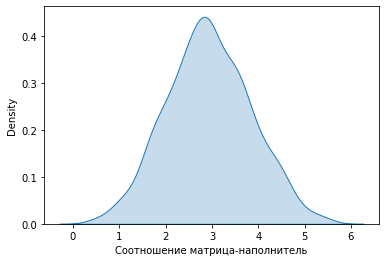

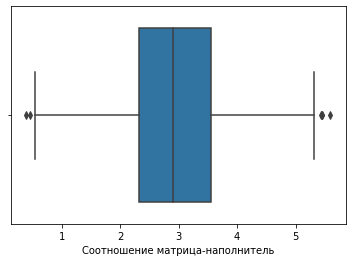

Плотность, кг/м3:


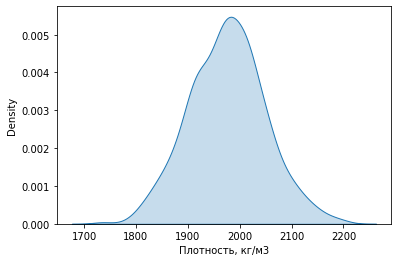

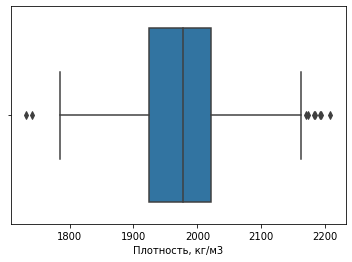

модуль упругости, ГПа:


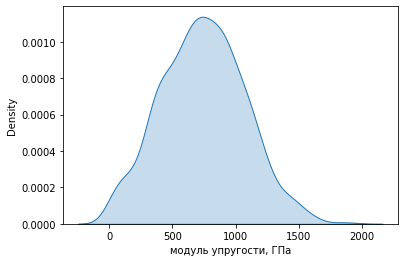

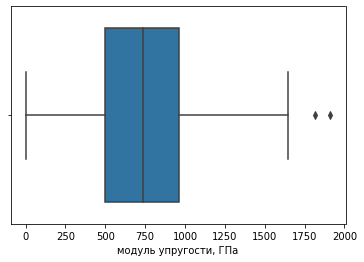

Количество отвердителя, м.%:


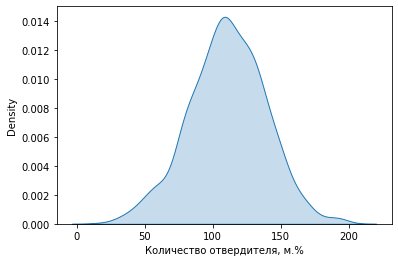

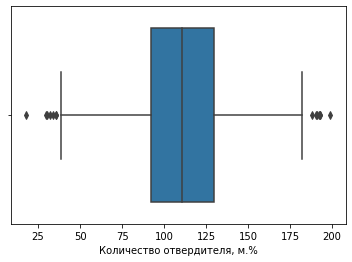

Содержание эпоксидных групп,%_2:


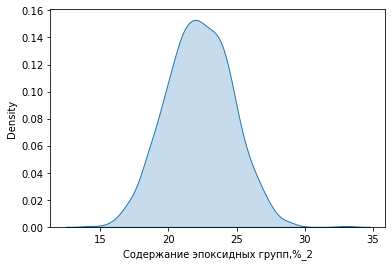

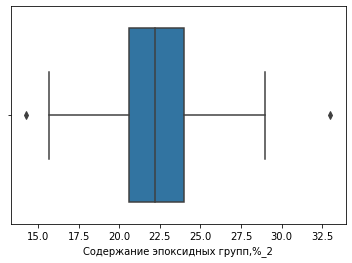

Температура вспышки, С_2:


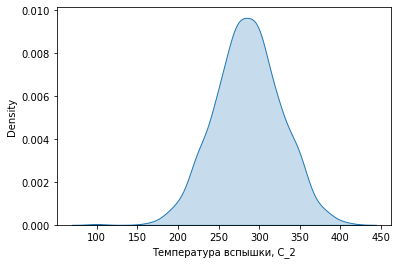

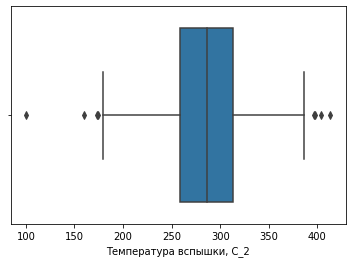

Поверхностная плотность, г/м2:


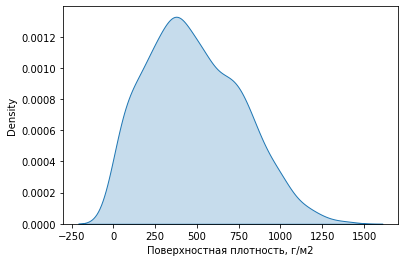

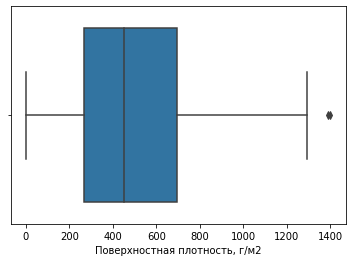

Модуль упругости при растяжении, ГПа:


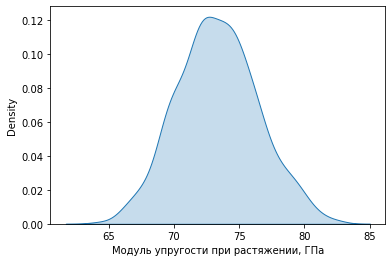

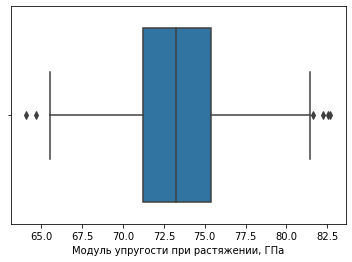

Прочность при растяжении, МПа:


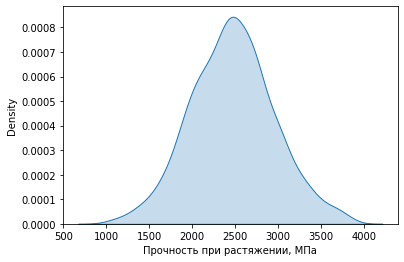

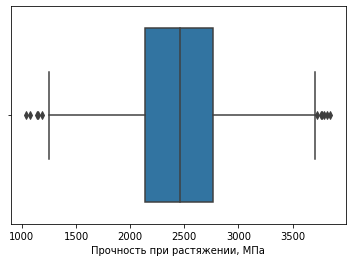

Потребление смолы, г/м2:


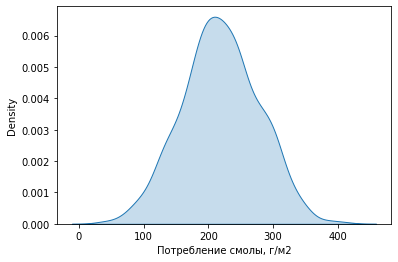

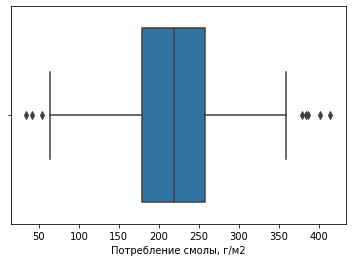

Угол нашивки, град:


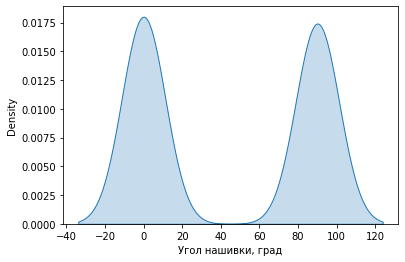

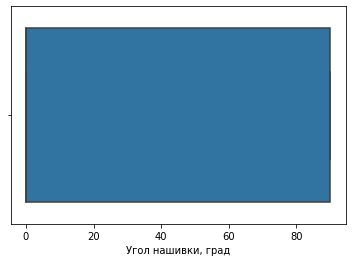

Шаг нашивки:


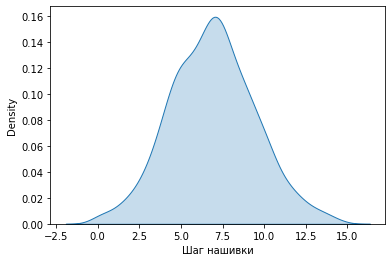

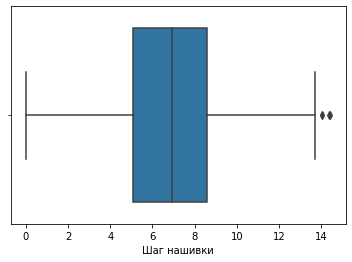

Плотность нашивки:


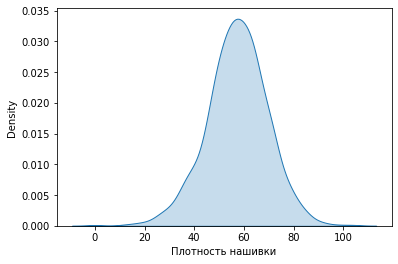

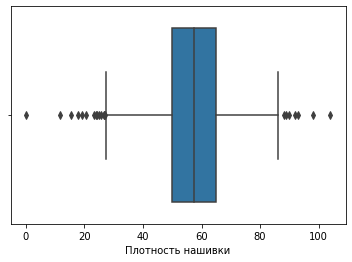

In [18]:
# переменная для вывода гистограмм и ящиков
def hst_bxp(df:pd.DataFrame) -> None:
  for col in df.columns:
    print('{column}:'.format(column=col))
    series = df[col]
    sns.kdeplot(data=series, shade=True)
    plt.show()
    sns.boxplot(x=series)
    plt.show()
# вывод данных
hst_bxp(df)

### Гистограммы и графики двумерной оценки плотности ядра

<Figure size 720x720 with 0 Axes>

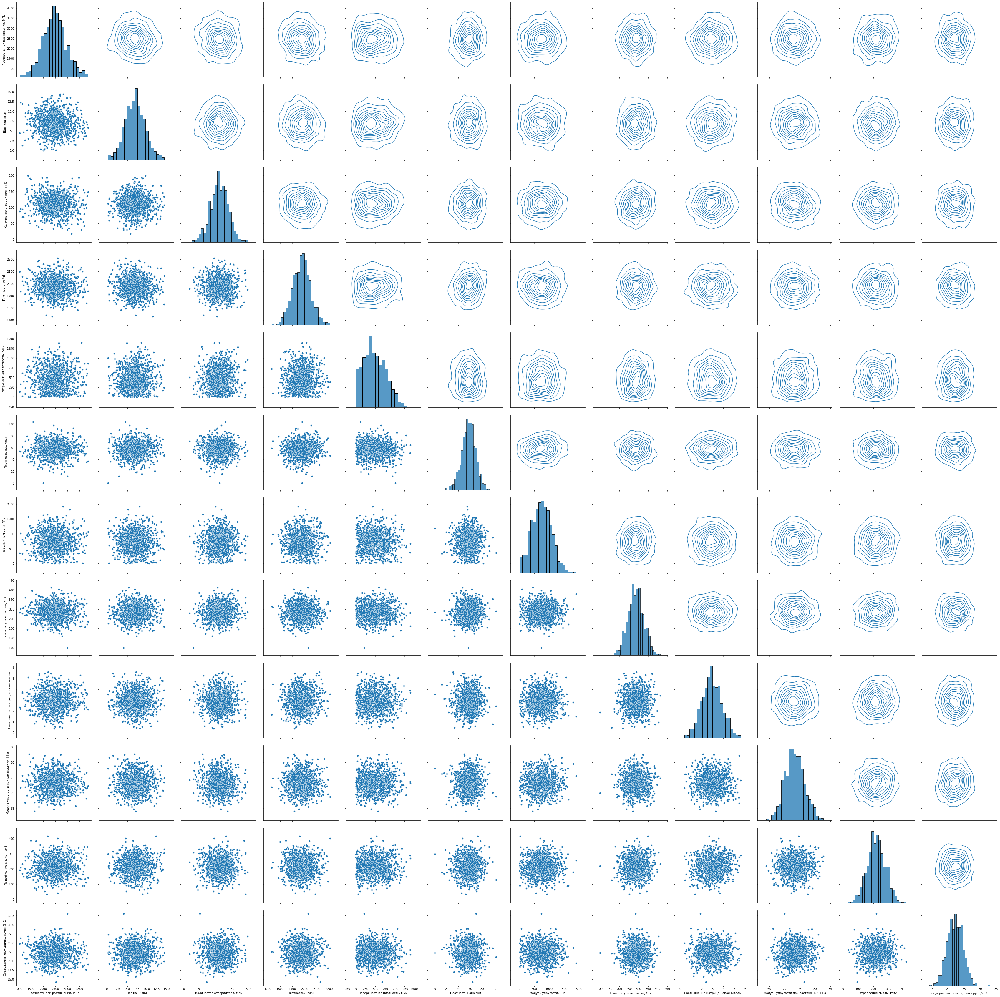

In [19]:
features = list(set(df.columns) - set(['Угол нашивки, град']))
plt.figure(figsize=(10,10))
#sns.set(style = 'white', palette = 'Wistia_r')
grids = sns.PairGrid(df[features], diag_sharey = False, height = 4)
grids.map_upper(sns.kdeplot)
grids.map_diag(sns.histplot, kde = False)
grids.map_lower(sns.scatterplot)
plt.savefig('histo_plotn.png', dpi=300, bbox_inches='tight')

### Попарные графики рассеяния

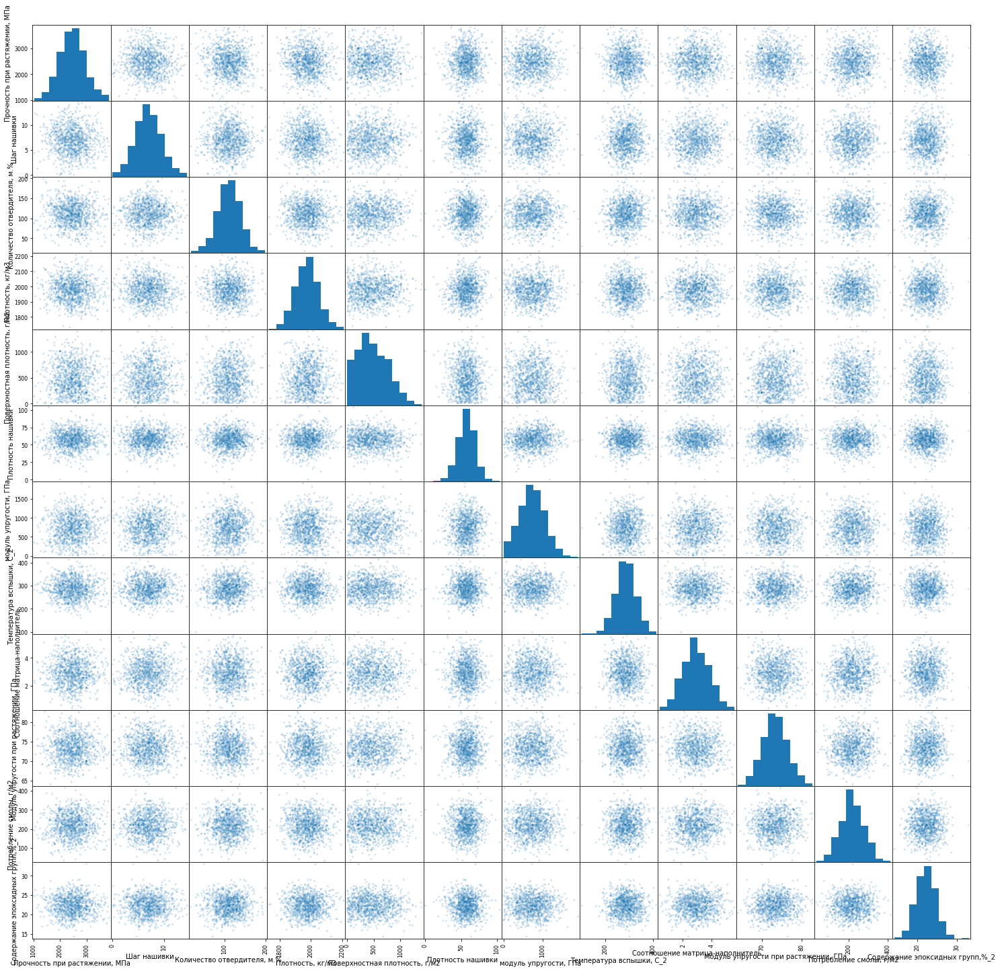

In [20]:
# матрица диаграмм рассеяния
from numpy.core.fromnumeric import diagonal
pd.plotting.scatter_matrix(df[features], alpha=0.2, figsize=(25,25), diagonal='hist')
plt.savefig('histo_rass.png', dpi=300, bbox_inches='tight')

### Корреляционная матрица и тепловые карты

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


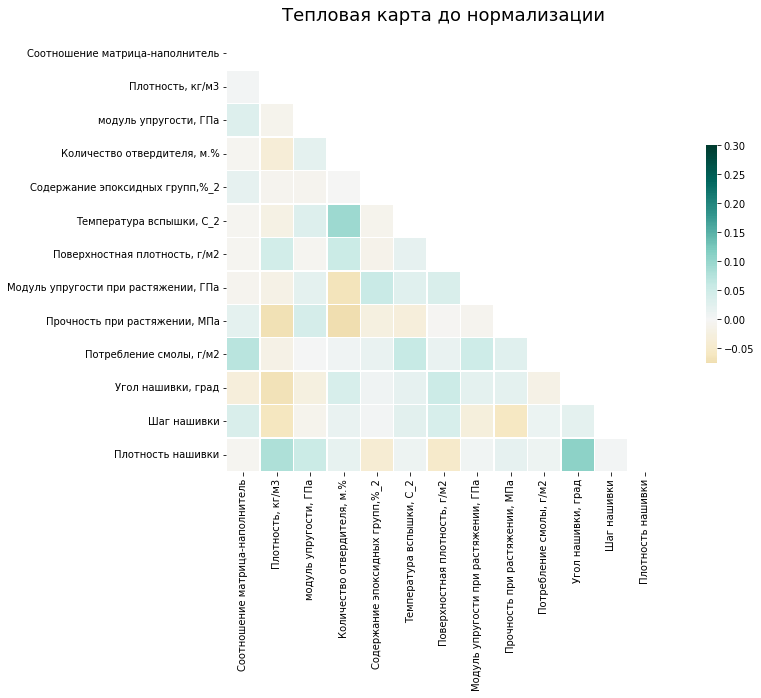

In [21]:
plt.figure(figsize=(16, 8)) 
mask = np.triu(np.ones_like(df.corr(), dtype=np.bool)) 
heatmap = sns.heatmap(df.corr(), mask=mask, cmap='BrBG', vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
heatmap.set_title('Тепловая карта до нормализации', fontdict={'fontsize':18}, pad=16);
plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

* Тепловая карта признаков показывает корреляцию, близкую к 0, что говорит об отсутствии линейной зависимости параметров друг от друга

In [22]:
# матрица коэффициентов корреляции
df.corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.003841,0.031700,-0.006445,0.019766,-0.004776,-0.006272,-0.008411,0.024148,0.072531,-0.031073,0.036437,-0.004652
"Плотность, кг/м3",0.003841,1.000000,-0.009647,-0.035911,-0.008278,-0.020695,0.044930,-0.017602,-0.069981,-0.015937,-0.068474,-0.061015,0.080304
"модуль упругости, ГПа",0.031700,-0.009647,1.000000,0.024049,-0.006804,0.031174,-0.005306,0.023267,0.041868,0.001840,-0.025417,-0.009875,0.056346
"Количество отвердителя, м.%",-0.006445,-0.035911,0.024049,1.000000,-0.000684,0.095193,0.055198,-0.065929,-0.075375,0.007446,0.038570,0.014887,0.017248
"Содержание эпоксидных групп,%_2",0.019766,-0.008278,-0.006804,-0.000684,1.000000,-0.009769,-0.012940,0.056828,-0.023899,0.015165,0.008052,0.003022,-0.039073
"Температура вспышки, С_2",-0.004776,-0.020695,0.031174,0.095193,-0.009769,1.000000,0.020121,0.028414,-0.031763,0.059954,0.020695,0.025795,0.011391
"Поверхностная плотность, г/м2",-0.006272,0.044930,-0.005306,0.055198,-0.012940,0.020121,1.000000,0.036702,-0.003210,0.015692,0.052299,0.038332,-0.049923
"Модуль упругости при растяжении, ГПа",-0.008411,-0.017602,0.023267,-0.065929,0.056828,0.028414,0.036702,1.000000,-0.009009,0.050938,0.023003,-0.029468,0.006476
"Прочность при растяжении, МПа",0.024148,-0.069981,0.041868,-0.075375,-0.023899,-0.031763,-0.003210,-0.009009,1.000000,0.028602,0.023398,-0.059547,0.019604
"Потребление смолы, г/м2",0.072531,-0.015937,0.001840,0.007446,0.015165,0.059954,0.015692,0.050938,0.028602,1.000000,-0.015334,0.013394,0.012239


# 3. Предобработка данных

## 3.1 Исключение выбросов

Соотношение матрица-наполнитель: 3s=0 iq=6


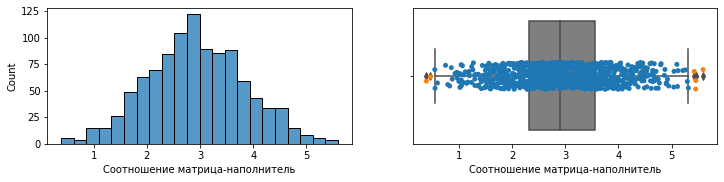

Плотность, кг/м3: 3s=3 iq=9


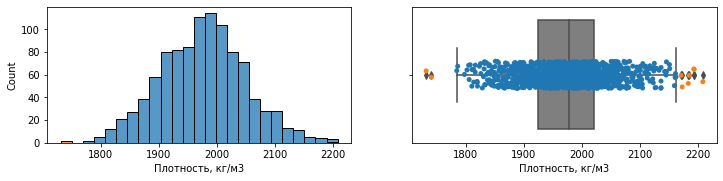

модуль упругости, ГПа: 3s=2 iq=2


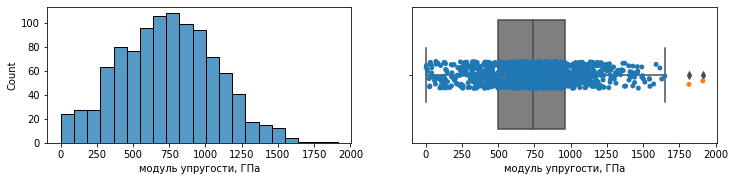

Количество отвердителя, м.%: 3s=2 iq=14


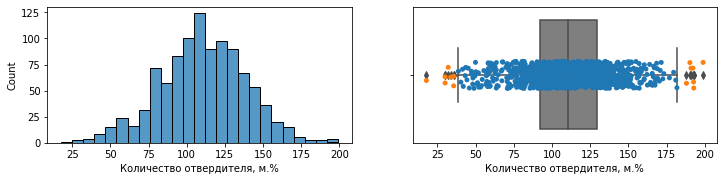

Содержание эпоксидных групп,%_2: 3s=2 iq=2


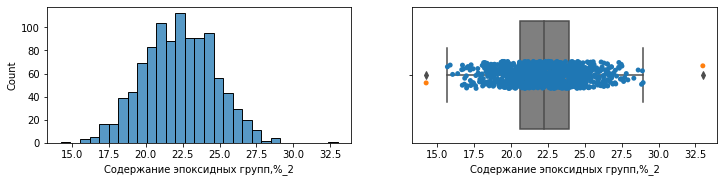

Температура вспышки, С_2: 3s=3 iq=8


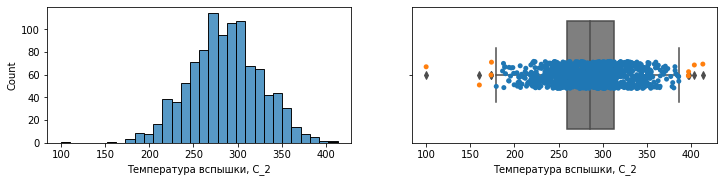

Поверхностная плотность, г/м2: 3s=2 iq=2


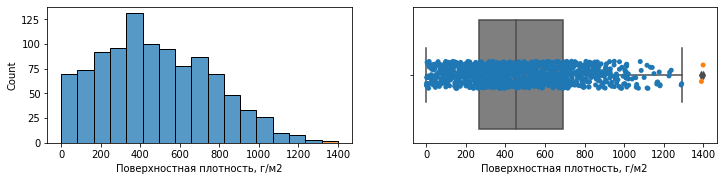

Модуль упругости при растяжении, ГПа: 3s=0 iq=6


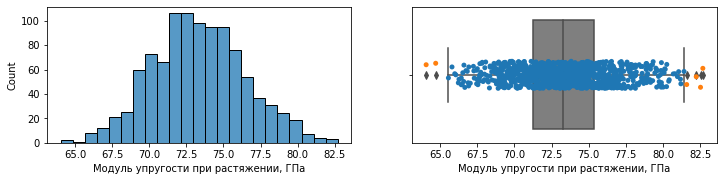

Прочность при растяжении, МПа: 3s=0 iq=11


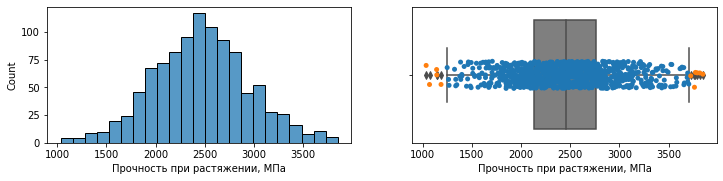

Потребление смолы, г/м2: 3s=3 iq=8


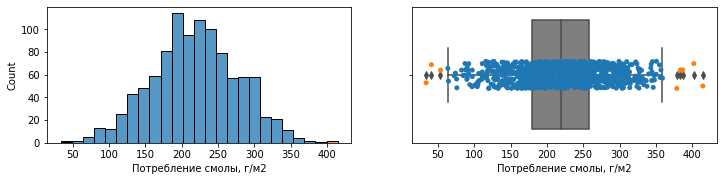

Угол нашивки, град: 3s=0 iq=0


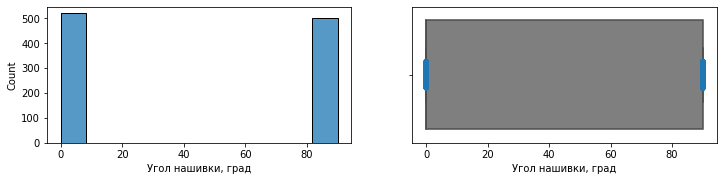

Шаг нашивки: 3s=0 iq=4


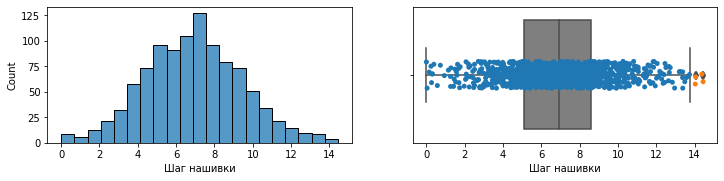

Плотность нашивки: 3s=7 iq=21


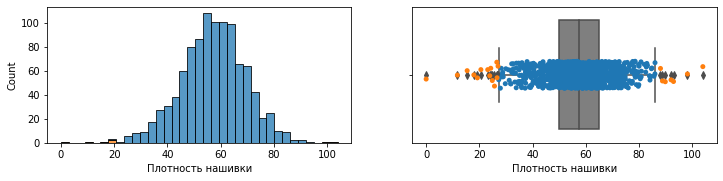

Метод 3-х сигм, выбросов: 24
Метод межквартильных интервалов, выбросов: 93


In [23]:
# подсчет количества выбросов 2-мя методами: 3-х сигм и межкартильных диапазонов
count_3s = 0
count_iq = 0
for column in df:
    d = df.loc[:, [column]]
 # метод 3-х сигм
    zscore = (df[column] - df[column].mean()) / df[column].std()
    d['3s'] = zscore.abs() > 3
    count_3s += d['3s'].sum()
 # метод межквартильных расстояний
    q1 = np.quantile(df[column], 0.25)
    q3 = np.quantile(df[column], 0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    d['iq'] = (df[column] <= lower) | (df[column] >= upper)
    count_iq += d['iq'].sum()
# визуализация выбросов
    print('{}: 3s={} iq={}'.format(column, d['3s'].sum(), d['iq'].sum()))
    fig, axes = plt.subplots(1, 2, figsize=(12, 2.5))
    sns.histplot(data=d, x=column, hue='3s', multiple='stack', legend=False, ax=axes[0])
    sns.boxplot(data=d, x=column, color='tab:gray', ax=axes[1])
    sns.stripplot(data=d[d['iq']==False], x=column, ax=axes[1])
    sns.stripplot(data=d[d['iq']==True], x=column, color='tab:orange', ax=axes[1])
    plt.show()
print('Метод 3-х сигм, выбросов:', count_3s)
print('Метод межквартильных интервалов, выбросов:', count_iq)

По методу найдено больше выбросов, поэтому очищаться набор данных будет с его помощью.

Удаление выбросов методом на основе межквартильных диапазонов (IQR):

* Расчет 1 и 3 квартиля (Q1, Q3)
* Оценка межквартильного диапазона, IQR
* Оценка нижней границы, не меньше, чем 25% квартиль плюс полтора интервала между 75% и 25% квартилями
* Оценка верхней границы, не больше, чем 75% квартиль плюс полтора интервала между 75% и 25% квартилямивыше * 1.5
* Замена данных, лежащих за пределами нижней м верхней границ на NaN

In [24]:
for column in df.columns:
    q75,q25 = np.percentile(df.loc[:,column],[75,25])
    iqr = q75-q25

    max = q75+(1.5*iqr)
    min = q25-(1.5*iqr)

    df.loc[df[column] < min,column] = np.nan
    df.loc[df[column] > max,column] = np.nan

In [25]:
df.isnull().sum()

Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Угол нашивки, град                       0
Шаг нашивки                              4
Плотность нашивки                       21
dtype: int64

In [26]:
df.dropna(inplace=True)

In [27]:
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [28]:
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1.0,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
3.0,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4.0,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
5.0,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,60.000000
6.0,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018.0,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019.0,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020.0,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021.0,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


## 3.2 Нормализация данных

In [29]:
# масштабирование значений в диапазон [0, 1]
scaler = MinMaxScaler()
df_norm=pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)

In [30]:
df_norm.head(5)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1.0,0.274768,0.651097,0.447061,0.079153,0.607435,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.289334,0.557156
3.0,0.274768,0.651097,0.447061,0.630983,0.418887,0.583596,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.335840
4.0,0.466552,0.651097,0.455721,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.506083
5.0,0.465836,0.571539,0.452685,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.557156
6.0,0.424236,0.332865,0.488508,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.727399


In [31]:
# Описательная статистика для нормализованного датасета
df_norm.describe().round(5).T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,936.0,0.49893,0.18749,0.0,0.37227,0.49454,0.62920,1.0
"Плотность, кг/м3",936.0,0.50270,0.18778,0.0,0.36852,0.51123,0.62500,1.0
"модуль упругости, ГПа",936.0,0.44676,0.19958,0.0,0.30124,0.44706,0.58045,1.0
"Количество отвердителя, м.%",936.0,0.50466,0.18886,0.0,0.37619,0.50604,0.63798,1.0
"Содержание эпоксидных групп,%_2",936.0,0.49122,0.18062,0.0,0.36772,0.48938,0.62341,1.0
"Температура вспышки, С_2",936.0,0.51606,0.19062,0.0,0.38613,0.51598,0.64645,1.0
"Поверхностная плотность, г/м2",936.0,0.37373,0.21708,0.0,0.20562,0.35416,0.53868,1.0
"Модуль упругости при растяжении, ГПа",936.0,0.48865,0.19147,0.0,0.35902,0.48575,0.61508,1.0
"Прочность при растяжении, МПа",936.0,0.49571,0.18891,0.0,0.36515,0.49182,0.61287,1.0
"Потребление смолы, г/м2",936.0,0.52114,0.19578,0.0,0.39207,0.52377,0.65245,1.0


### Диаграммы размаха после нормализации

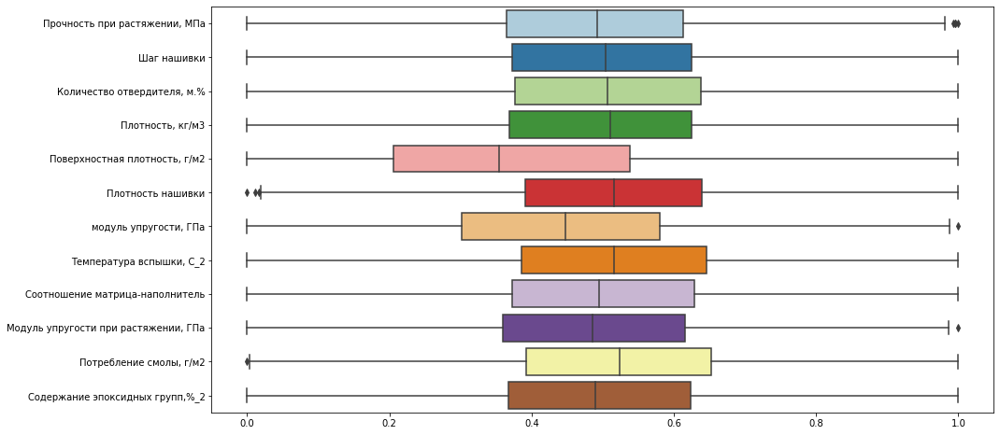

In [32]:
#boxplot = df_norm.boxplot(figsize=(16,30), vert=False)
from matplotlib import rcParams
rcParams['figure.figsize'] = 15,8
sns.boxplot(data=df_norm[features], palette="Paired", orient='h')
plt.savefig('boxplot_norm.png', dpi=300, bbox_inches='tight')

### Гистограммы после нормализации

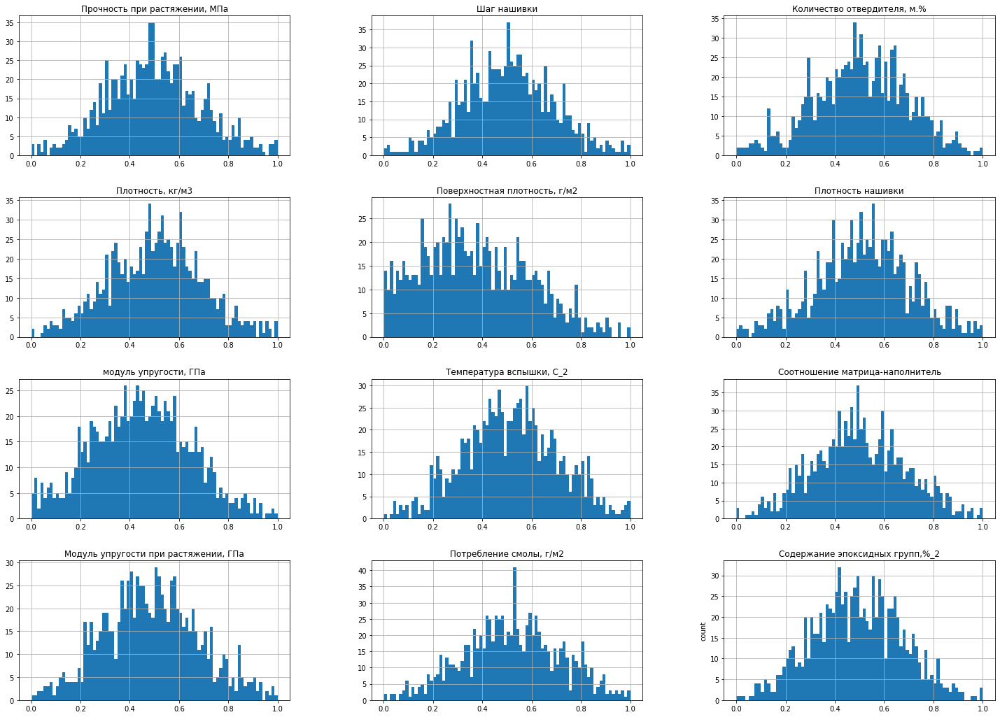

In [33]:
features = list(set(df_norm.columns) - set(['Угол нашивки, град']))
picture = df_norm[features].hist(figsize=(25,18), bins=80);
plt.ylabel("count");
plt.savefig('histo_norm.png', dpi=300, bbox_inches='tight')

### Корреляционная матрица и тепловая карта после нормализации

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


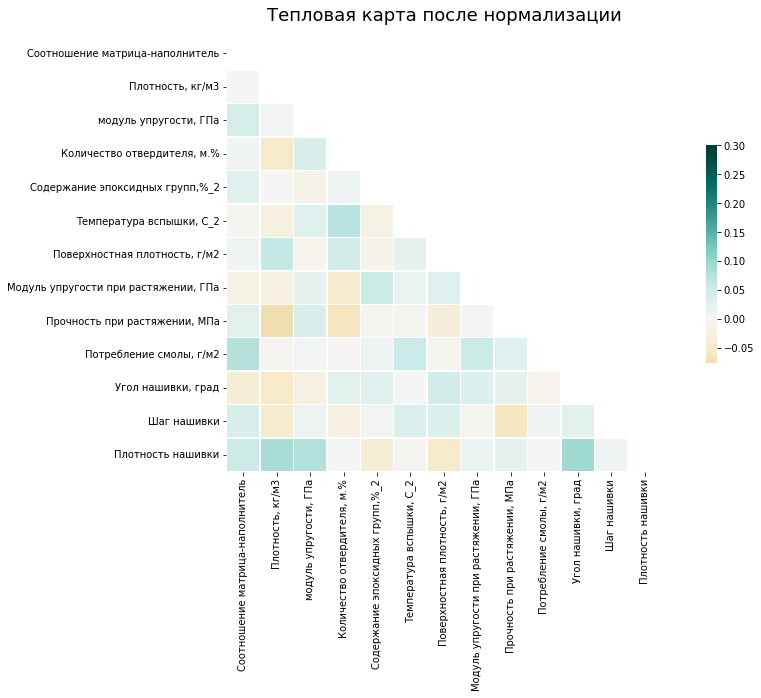

In [34]:
plt.figure(figsize=(16, 8)) 
mask = np.triu(np.ones_like(df.corr(), dtype=np.bool)) 
heatmap = sns.heatmap(df_norm.corr(), mask=mask, cmap='BrBG', vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
heatmap.set_title('Тепловая карта после нормализации', fontdict={'fontsize':18}, pad=16);
plt.savefig('heatmap_norm.png', dpi=300, bbox_inches='tight')

In [35]:
df_norm.corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.001676,0.043888,0.007812,0.027587,-0.006275,0.007540,-0.019248,0.024488,0.075740,-0.035897,0.039109,0.052466
"Плотность, кг/м3",0.001676,1.000000,0.004326,-0.050210,-0.001065,-0.023507,0.062705,-0.021316,-0.076305,-0.005133,-0.051336,-0.045229,0.084077
"модуль упругости, ГПа",0.043888,0.004326,1.000000,0.036523,-0.013271,0.029318,-0.008987,0.021086,0.036641,0.004450,-0.021886,0.011345,0.078091
"Количество отвердителя, м.%",0.007812,-0.050210,0.036523,1.000000,0.011330,0.072273,0.046211,-0.048208,-0.063256,-0.002268,0.026539,-0.021198,0.001485
"Содержание эпоксидных групп,%_2",0.027587,-0.001065,-0.013271,0.011330,1.000000,-0.019085,-0.013065,0.055271,-0.007097,0.011575,0.026645,0.004465,-0.036126
"Температура вспышки, С_2",-0.006275,-0.023507,0.029318,0.072273,-0.019085,1.000000,0.018884,0.015361,-0.004877,0.057693,0.001721,0.032580,-0.006801
"Поверхностная плотность, г/м2",0.007540,0.062705,-0.008987,0.046211,-0.013065,0.018884,1.000000,0.029643,-0.031777,-0.008295,0.045785,0.033065,-0.048670
"Модуль упругости при растяжении, ГПа",-0.019248,-0.021316,0.021086,-0.048208,0.055271,0.015361,0.029643,1.000000,-0.001422,0.055023,0.034193,-0.007546,0.013445
"Прочность при растяжении, МПа",0.024488,-0.076305,0.036641,-0.063256,-0.007097,-0.004877,-0.031777,-0.001422,1.000000,0.027949,0.017669,-0.061219,0.016894
"Потребление смолы, г/м2",0.075740,-0.005133,0.004450,-0.002268,0.011575,0.057693,-0.008295,0.055023,0.027949,1.000000,-0.009916,0.007569,0.001448


# 4. Обучение моделей

In [36]:
df_norm.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [37]:
# выделение из датасета прогнозируемых параметров
X_upr = df_norm.drop(['Модуль упругости при растяжении, ГПа'], axis=1)
y_upr = df_norm[['Модуль упругости при растяжении, ГПа']]
X_pr = df_norm.drop(['Прочность при растяжении, МПа'], axis=1)
y_pr = df_norm[['Прочность при растяжении, МПа']]
X_train_upr, X_test_upr, y_train_upr, y_test_upr = train_test_split(X_upr, y_upr, test_size=0.3, random_state=RANDOM_STATE)
X_train_pr, X_test_pr, y_train_pr, y_test_pr = train_test_split(X_pr, y_pr, test_size=0.3, random_state=RANDOM_STATE)
print("Размерность обучающей выборки для Модуля упругости при растяжении:", X_train_upr.shape)
print("Размерность тестовой выборки для Модуля упругости при растяжении:", X_test_upr.shape)
print("Размерность обучающей выборки для Прочности при растяжении:", X_train_pr.shape)
print("Размерность тестовой выборки для Прочности при растяжении:", X_test_pr.shape)

Размерность обучающей выборки для Модуля упругости при растяжении: (655, 12)
Размерность тестовой выборки для Модуля упругости при растяжении: (281, 12)
Размерность обучающей выборки для Прочности при растяжении: (655, 12)
Размерность тестовой выборки для Прочности при растяжении: (281, 12)


In [38]:
# датасет для сбора полученных метрик
models = pd.DataFrame()

## 4.0 Dummy Regression

In [39]:
# используется как базиса для сравнения с другими (реальными) алгоритмами регрессорами
dr = DummyRegressor()
dr_params = {
    'strategy': ['mean', 'median', 'quantile', 'constant']
}

### Модуль упругости при растяжении

In [40]:
# обучаем модель с параметрами по умолчанию, т.е. "предсказываться" всегда будет среднее (strategy = mean) значение
dr.fit(X_train_upr, y_train_upr)
# запуск предсказания для модели на основе тестового набора данных X_test
y_pred_upr = dr.predict(X_test_upr)
# выведем первые пять значений с помощью диапазона индексов
print(y_pred_upr[:5])

[0.48434484 0.48434484 0.48434484 0.48434484 0.48434484]


In [41]:
# метрики, полученные моделью с параметрами по умолчанию
dr_def_upr_result = pd.DataFrame({
   'Model': 'DummyRegression_mean', 
   'MSE': metrics.mean_squared_error(y_test_upr, y_pred_upr),
   'MAE': metrics.mean_absolute_error(y_test_upr, y_pred_upr),
   'R^2': metrics.r2_score(y_test_upr, y_pred_upr)
   }, index=['Модуль упругости при растяжении'])

In [42]:
models = pd.concat([models, dr_def_upr_result])

In [43]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.00593


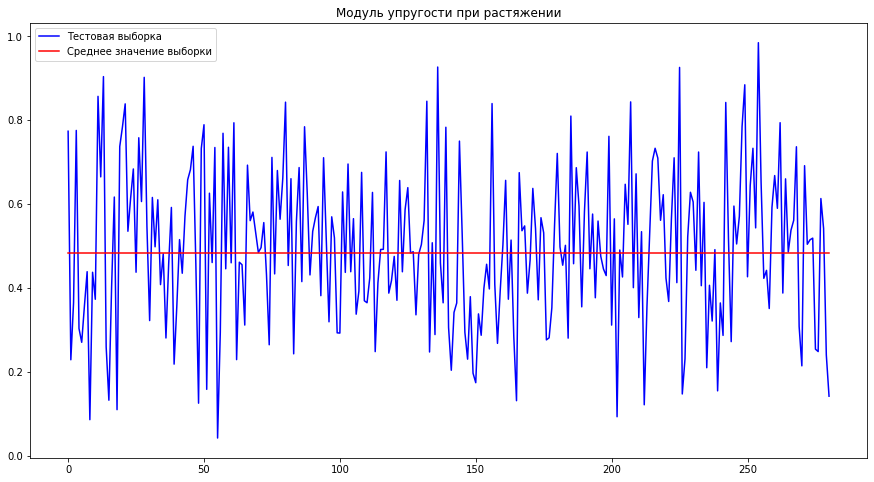

In [44]:
# Визуализация результата
rcParams['figure.figsize'] = 15,8
plt.plot(range(len(y_test_upr)), y_test_upr, label='Тестовая выборка', color = 'b')
plt.plot(range(len(dr.predict(X_test_upr))), dr.predict(X_test_upr), color = 'r', label='Среднее значение выборки')
plt.title('Модуль упругости при растяжении', fontsize=12)
plt.legend(loc = 2, fontsize = 10)
plt.savefig("model_DR_upr.svg")

(0.0, 1.0)

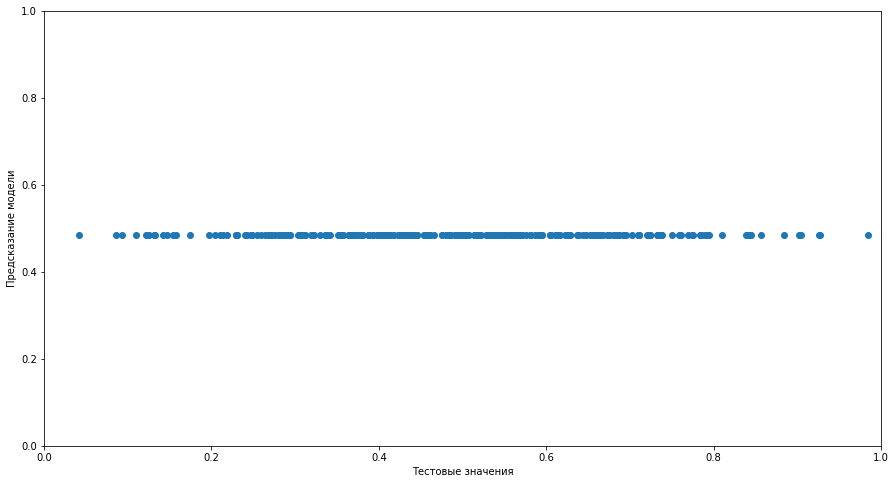

In [45]:
rcParams['figure.figsize'] = 15,8
plt.scatter(y_test_upr, y_pred_upr)
plt.xlabel("Тестовые значения")
plt.ylabel("Предсказание модели")
limits = [0,1]
plt.xlim(limits)
plt.ylim(limits)

### Прочность при растяжении

In [46]:
# обучаем модель с параметрами по умолчанию
dr.fit(X_train_pr, y_train_pr)
# запуск предсказания для модели на основе тестового набора данных X_test
y_pred_pr = dr.predict(X_test_pr)
# выведем первые пять значений с помощью диапазона индексов
print(y_pred_pr[:5])

[0.48619019 0.48619019 0.48619019 0.48619019 0.48619019]


In [47]:
# метрики, полученные моделью с параметрами по умолчанию
dr_def_pr_result = pd.DataFrame({
   'Model': 'DummyRegression_mean', 
   'MSE': metrics.mean_squared_error(y_test_pr, y_pred_pr),
   'MAE': metrics.mean_absolute_error(y_test_pr, y_pred_pr),
   'R^2': metrics.r2_score(y_test_pr, y_pred_pr)
   }, index=['Прочность при растяжении'])

In [48]:
models = pd.concat([models, dr_def_pr_result])

In [49]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930


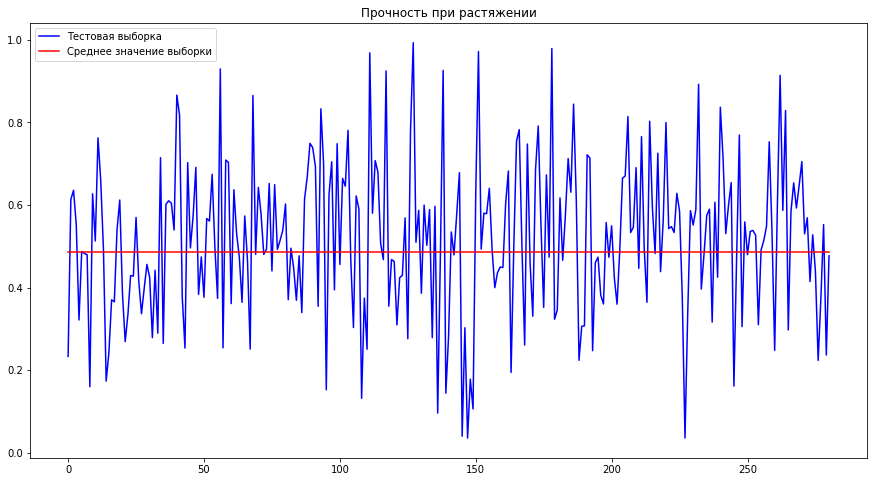

In [50]:
# Визуализация результата
rcParams['figure.figsize'] = 15,8
plt.plot(range(len(y_test_pr)), y_test_pr, label='Тестовая выборка', color = 'b')
plt.plot(range(len(dr.predict(X_test_pr))), dr.predict(X_test_pr), color = 'r', label='Среднее значение выборки')
plt.title('Прочность при растяжении', fontsize=12)
plt.legend(loc = 2, fontsize = 10)
plt.savefig("model_DR_pr.svg")

(0.0, 1.0)

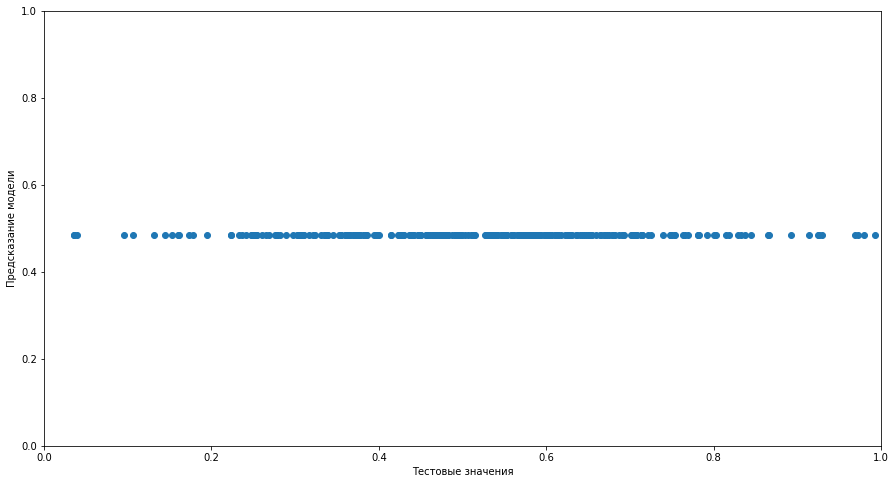

In [51]:
rcParams['figure.figsize'] = 15,8
plt.scatter(y_test_pr, y_pred_upr)
plt.xlabel("Тестовые значения")
plt.ylabel("Предсказание модели")
limits = [0,1]
plt.xlim(limits)
plt.ylim(limits)

 ## 4.1 Linear Regression

In [52]:
# модель линейной регресии из библиотеки sklearn 
lr = LinearRegression()
lr_params = {
    'fit_intercept' : ['True', 'False']
}

### Модуль упругости при растяжении (параметры по умолчанию)

In [53]:
# обучаем модель с параметрами по умолчанию
lr_def_upr = lr.fit(X_train_upr, y_train_upr)
# запуск предсказания для модели на основе тестового набора данных X_test
y_pred_upr = lr.predict(X_test_upr)
# выведем первые пять значений с помощью диапазона индексов
print(y_pred_upr[:5])

[[0.47677262]
 [0.49999504]
 [0.51792598]
 [0.50305082]
 [0.49098606]]


In [54]:
# проверка accuracy ???
print('Linear Regression Model:')
print("Train Score:{:.2f}".format(lr_def_upr.score(X_train_upr, y_train_upr)))
print("Test Score:{:.2f}".format(lr_def_upr.score(X_test_upr, y_test_upr)))


Linear Regression Model:
Train Score:0.02
Test Score:-0.01


In [55]:
# метрики, полученные моделью с параметрами по умолчанию
lr_def_upr_result = pd.DataFrame({
   'Model': 'LinearRegression_default', 
   'MSE': metrics.mean_squared_error(y_test_upr, y_pred_upr),
   'MAE': metrics.mean_absolute_error(y_test_upr, y_pred_upr),
    'R^2': metrics.r2_score(y_test_upr, y_pred_upr)
   }, index=['Модуль упругости при растяжении'])

In [56]:
models = pd.concat([models, lr_def_upr_result])

In [57]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,LinearRegression_default,0.034808,0.152207,-0.005222


### Модуль упругости при растяжении - поиск лучших гиперпараметров

In [58]:
# поиск лучших гиперпараметров модели с помощью поиска по сетке с перекрестной проверкой, количество блоков равно 10
GSCV_lr_best_upr = GridSearchCV(lr, lr_params, n_jobs=-1, cv=10)
GSCV_lr_best_upr.fit(X_train_upr, y_train_upr)
GSCV_lr_best_upr.best_params_

{'fit_intercept': 'True'}

In [59]:
lr_best_upr = GSCV_lr_best_upr.best_estimator_

In [60]:
# проверка accuracy
print('Linear Regression Model:')
print("Train Score:{:.2f}".format(lr_best_upr.score(X_train_upr, y_train_upr)))
print("Test Score:{:.2f}".format(lr_best_upr.score(X_test_upr, y_test_upr)))

Linear Regression Model:
Train Score:0.02
Test Score:-0.01


In [61]:
lr_best_upr_result = pd.DataFrame({
   'Model': 'LinearRegression_best',
   'MSE': metrics.mean_squared_error(y_test_upr, lr_best_upr.predict(X_test_upr)),
   'MAE': metrics.mean_absolute_error(y_test_upr, lr_best_upr.predict(X_test_upr)), 
   'R^2': metrics.r2_score(y_test_upr, lr_best_upr.predict(X_test_upr))
   }, index=['Модуль упругости при растяжении'])

In [62]:
models = pd.concat([models, lr_best_upr_result])

In [63]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,LinearRegression_default,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,LinearRegression_best,0.034808,0.152207,-0.005222


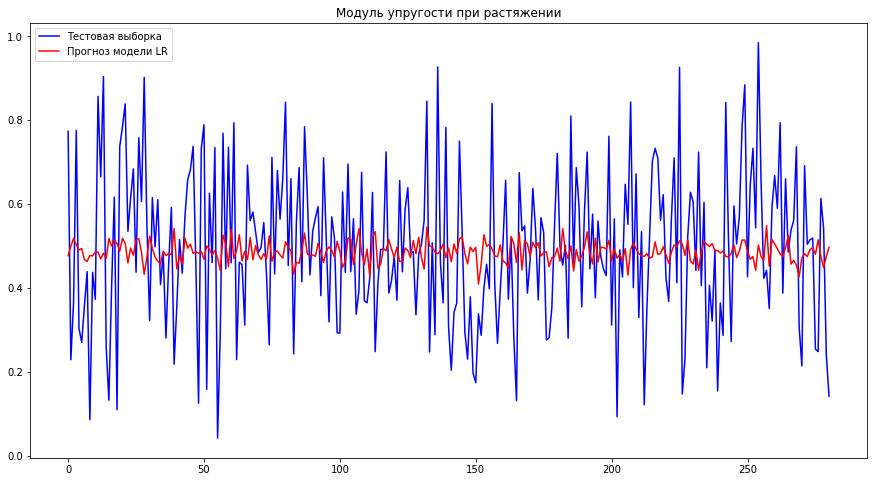

In [64]:
# визуализация результата
rcParams['figure.figsize'] = 15,8
plt.plot(range(len(y_test_upr)), y_test_upr, label='Тестовая выборка', color = 'b')
plt.plot(range(len(lr_best_upr.predict(X_test_upr))), lr_best_upr.predict(X_test_upr), color = 'r', label='Прогноз модели LR')
plt.title('Модуль упругости при растяжении', fontsize=12)
plt.legend(loc = 2, fontsize = 10)
plt.savefig("model_LR_upr.svg")

(0.0, 1.0)

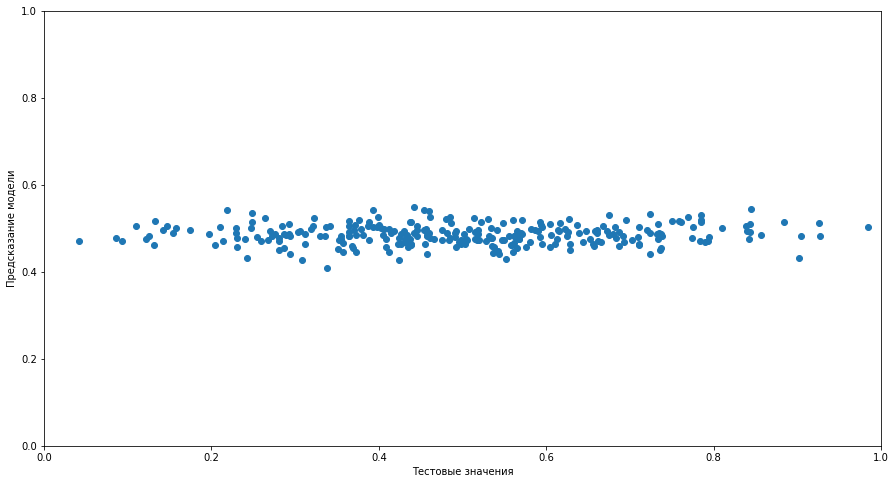

In [65]:
rcParams['figure.figsize'] = 15,8
plt.scatter(y_test_upr, y_pred_upr)
plt.xlabel("Тестовые значения")
plt.ylabel("Предсказание модели")
limits = [0,1]
plt.xlim(limits)
plt.ylim(limits)

### Прочность при растяжении - параметры по умолчанию

In [66]:
lr.fit(X_train_pr, y_train_pr)
y_pred_pr = lr.predict(X_test_pr)
print(y_pred_pr[:5])

[[0.43582601]
 [0.49110308]
 [0.51690751]
 [0.51573906]
 [0.48183053]]


In [67]:
# метрики, полученные моделью с параметрами по умолчанию
lr_def_pr_result = pd.DataFrame({
   'Model': 'LinearRegression_default',
   'MSE': metrics.mean_squared_error(y_test_pr, y_pred_pr),
   'MAE': metrics.mean_absolute_error(y_test_pr, y_pred_pr),
   'R^2': metrics.r2_score(y_test_pr, y_pred_pr)
   }, index=['Прочность при растяжении'])


In [68]:
models = pd.concat([models, lr_def_pr_result])

In [69]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,LinearRegression_default,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,LinearRegression_best,0.034808,0.152207,-0.005222


### Прочность при растяжении - поиск лучших гиперпараметров

In [70]:
GSCV_lr_best_pr = GridSearchCV(lr, lr_params, n_jobs=-1, cv=10)
GSCV_lr_best_pr.fit(X_train_pr, y_train_pr)
GSCV_lr_best_pr.best_params_

{'fit_intercept': 'True'}

In [71]:
lr_best_pr = GSCV_lr_best_pr.best_estimator_

In [72]:
lr_best_pr_result = pd.DataFrame({
   'Model': 'LinearRegression_best',
   'MSE': metrics.mean_squared_error(y_test_pr, lr_best_pr.predict(X_test_pr)),
   'MAE': metrics.mean_absolute_error(y_test_pr, lr_best_pr.predict(X_test_pr)),
   'R^2': metrics.r2_score(y_test_pr, lr_best_pr.predict(X_test_pr))
   }, index=['Прочность при растяжении'])

In [73]:
models = pd.concat([models, lr_best_pr_result])

In [74]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,LinearRegression_default,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,LinearRegression_best,0.034808,0.152207,-0.005222


Только 2,1% изменчивости моlуля упругости объясняется другими переменными, которые использовались при обучении модели

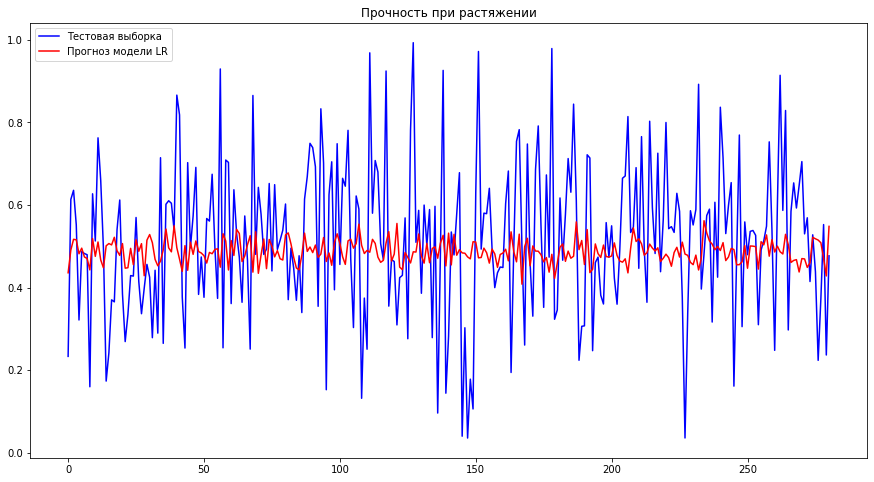

In [75]:
rcParams['figure.figsize'] = 15,8
plt.plot(range(len(y_test_pr)), y_test_pr, label='Тестовая выборка', color = 'b')
plt.plot(range(len(lr_best_pr.predict(X_test_pr))), lr_best_pr.predict(X_test_pr), color = 'r', label='Прогноз модели LR')
plt.title('Прочность при растяжении', fontsize=12)
plt.legend(loc = 2, fontsize = 10)
plt.savefig("model_LR_pr.svg")

(0.0, 1.0)

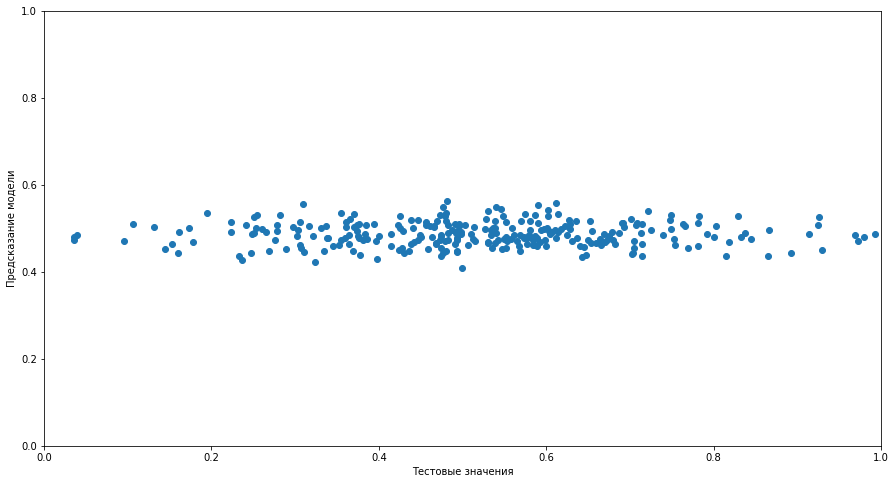

In [76]:
rcParams['figure.figsize'] = 15,8
plt.scatter(y_test_pr, y_pred_pr)
plt.xlabel("Тестовые значения")
plt.ylabel("Предсказание модели")
limits = [0,1]
plt.xlim(limits)
plt.ylim(limits)

## 4.2 Random Forest Regressor

In [77]:
rf = RandomForestRegressor()
rf_params = {
    'n_estimators' : range(10, 1000, 10),
    'criterion' : ['squared_error', 'absolute_error', 'poisson'],
    'max_depth' : range(1, 7),
    'min_samples_split' : range(20, 50, 5),
    'min_samples_leaf' : range(2, 8),
    'bootstrap' : ['True', 'False']
}

### Модуль упругости при растяжении - параметры по умолчанию

In [78]:
# обучение с параметрами по умолчанию
rf.fit(X_train_upr, np.ravel(y_train_upr))
# запуск предсказания для модели на основе тестового набора данных X_test
y_pred_upr = rf.predict(X_test_upr)
print(y_pred_upr[:5])

[0.48565378 0.50478105 0.43606326 0.50955636 0.43245691]


In [79]:
rf_def_upr_result = pd.DataFrame({
   'Model': 'RandomForestRegressor_default',
   'MSE': metrics.mean_squared_error(y_test_upr, y_pred_upr),
   'MAE': metrics.mean_absolute_error(y_test_upr, y_pred_upr), 
   'R^2': metrics.r2_score(y_test_upr, y_pred_upr)
   }, index=['Модуль упругости при растяжении'])

In [80]:
models = pd.concat([models, rf_def_upr_result])

In [81]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,LinearRegression_default,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,LinearRegression_best,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,RandomForestRegressor_default,0.036049,0.154849,-0.041076


### Модуль упругости при растяжении - поиск лучших гиперпараметров 

In [82]:
# не дождался завершения команды, прервал на времени выполнения = 1ч 10 мин 
# ниже сделано на RandomizedSearchCV
#GSCV_rf_best_upr = GridSearchCV(rf, rf_params, n_jobs=-1, cv=10, verbose=4)
#GSCV_rf_best_upr.fit(X_train_upr, np.ravel(y_train_upr))
#GSCV_rf_best_upr.best_params_

In [83]:
# поиск лучших гиперпараметров модели с помощью поиска по сетке с перекрестной проверкой, количество блоков равно 10
RSCV_rf_best_upr = RandomizedSearchCV(rf, rf_params, n_jobs=-1, cv=10, verbose=4)
RSCV_rf_best_upr.fit(X_train_upr, np.ravel(y_train_upr))
RSCV_rf_best_upr.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


{'bootstrap': 'False',
 'criterion': 'poisson',
 'max_depth': 1,
 'min_samples_leaf': 2,
 'min_samples_split': 25,
 'n_estimators': 90}

In [84]:
rf_best_upr = RSCV_rf_best_upr.best_estimator_

In [85]:
rf_best_upr_result = pd.DataFrame({
   'Model': 'RandomForestRegressor_best', 
   'MSE': metrics.mean_squared_error(y_test_upr, rf_best_upr.predict(X_test_upr)),
   'MAE': metrics.mean_absolute_error(y_test_upr, rf_best_upr.predict(X_test_upr)), 
   'R^2': metrics.r2_score(y_test_upr, rf_best_upr.predict(X_test_upr))
   }, index=['Модуль упругости при растяжении'])

In [86]:
models = pd.concat([models, rf_best_upr_result])

In [87]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,LinearRegression_default,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,LinearRegression_best,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,RandomForestRegressor_default,0.036049,0.154849,-0.041076


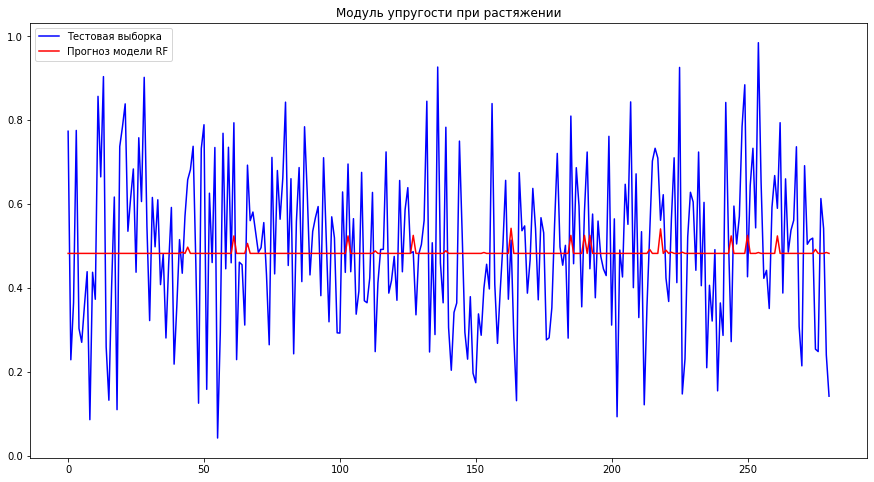

In [88]:
rcParams['figure.figsize'] = 15,8
plt.plot(range(len(y_test_upr)), y_test_upr, label='Тестовая выборка', color = 'b')
plt.plot(range(len(rf_best_upr.predict(X_test_upr))), rf_best_upr.predict(X_test_upr), color = 'r', label='Прогноз модели RF')
plt.title('Модуль упругости при растяжении', fontsize=12)
plt.legend(loc = 2, fontsize = 10)
plt.savefig("model_RF_upr.svg")

(0.0, 1.0)

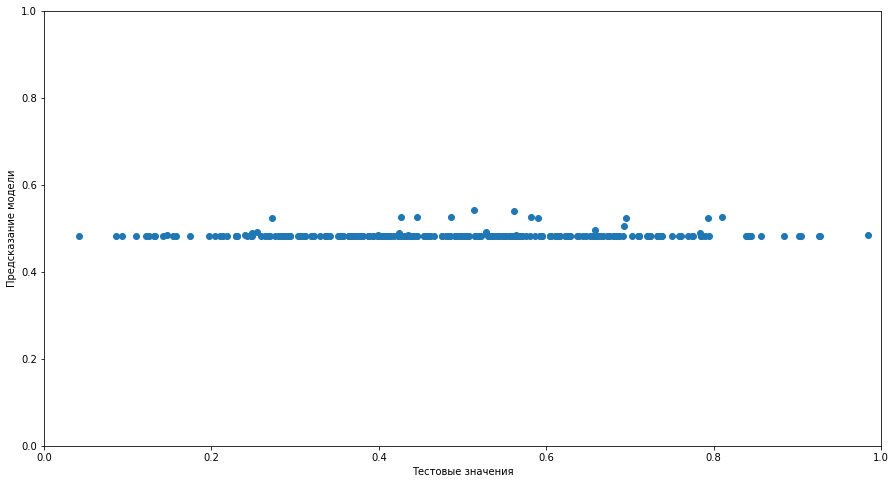

In [89]:
rcParams['figure.figsize'] = 15,8
plt.scatter(y_test_upr, rf_best_upr.predict(X_test_upr))
plt.xlabel("Тестовые значения")
plt.ylabel("Предсказание модели")
limits = [0,1]
plt.xlim(limits)
plt.ylim(limits)

### Прочность при растяжении - параметры по умолчанию

In [90]:
# обучение с параметрами по умолчанию
rf.fit(X_train_pr, np.ravel(y_train_pr))
y_pred_pr = rf.predict(X_test_pr)
# выведем первые пять значений с помощью диапазона индексов
print(y_pred_pr[:5])

[0.40834278 0.47425288 0.58318266 0.51064357 0.42366736]


In [91]:
rf_def_pr_result = pd.DataFrame({
   'Model': 'RandomForestRegressor_default',
   'MSE': metrics.mean_squared_error(y_test_pr, y_pred_pr),
   'MAE': metrics.mean_absolute_error(y_test_pr, y_pred_pr),
   'R^2': metrics.r2_score(y_test_pr, y_pred_pr)
   }, index=['Прочность при растяжении'])


In [92]:
models = pd.concat([models, rf_def_pr_result])

In [93]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Прочность при растяжении,RandomForestRegressor_default,0.035997,0.152083,-0.063189
Модуль упругости при растяжении,LinearRegression_default,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,LinearRegression_best,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,RandomForestRegressor_default,0.036049,0.154849,-0.041076


### Прочность при растяжении - поиск лучших гиперпараметров

In [94]:
RSCV_rf_best_pr = RandomizedSearchCV(rf, rf_params, n_jobs=-1, cv=10, verbose=4)
RSCV_rf_best_pr.fit(X_train_pr, np.ravel(y_train_pr))
RSCV_rf_best_pr.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


{'bootstrap': 'False',
 'criterion': 'squared_error',
 'max_depth': 1,
 'min_samples_leaf': 5,
 'min_samples_split': 45,
 'n_estimators': 750}

In [95]:
rf_best_pr = RSCV_rf_best_pr.best_estimator_

In [96]:
rf_best_pr_result = pd.DataFrame({
   'Model': 'RandomForestRegressor_best',
   'MSE': metrics.mean_squared_error(y_test_pr, rf_best_pr.predict(X_test_pr)),
   'MAE': metrics.mean_absolute_error(y_test_pr, rf_best_pr.predict(X_test_pr)),
   'R^2': metrics.r2_score(y_test_pr, rf_best_pr.predict(X_test_pr))
   }, index=['Прочность при растяжении']) 

In [97]:
models = pd.concat([models, rf_best_pr_result])

In [98]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,RandomForestRegressor_best,0.035039,0.147426,-0.034884
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Прочность при растяжении,RandomForestRegressor_default,0.035997,0.152083,-0.063189
Модуль упругости при растяжении,LinearRegression_default,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,LinearRegression_best,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,RandomForestRegressor_default,0.036049,0.154849,-0.041076


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- Прочность при растяжении, МПа
Feature names seen at fit time, yet now missing:
- Модуль упругости при растяжении, ГПа

  warnings.warn(message, FutureWarning)


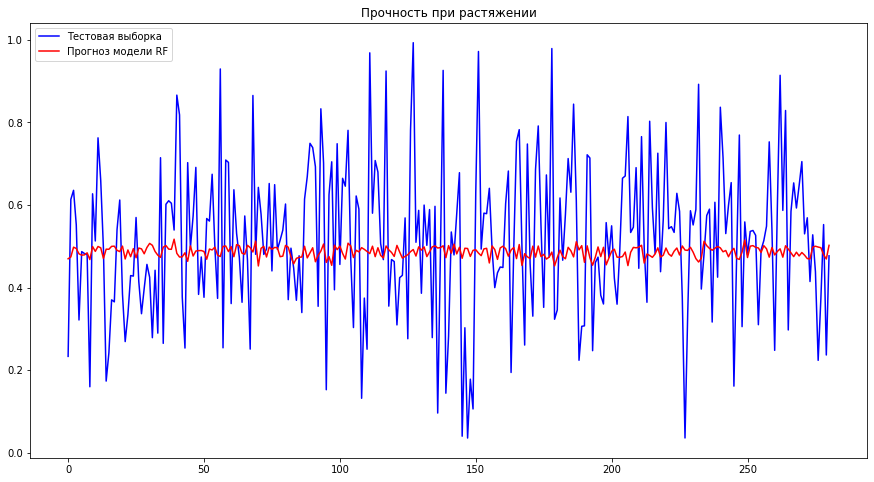

In [99]:
# Визуализация результата
rcParams['figure.figsize'] = 15,8
plt.plot(range(len(y_test_pr)), y_test_pr, label='Тестовая выборка', color = 'b')
plt.plot(range(len(rf_best_pr.predict(X_test_upr))), rf_best_pr.predict(X_test_pr), color = 'r', label='Прогноз модели RF')
plt.title('Прочность при растяжении', fontsize=12)
plt.legend(loc = 2, fontsize = 10)
plt.savefig("model_RF_pr.svg")

(0.0, 1.0)

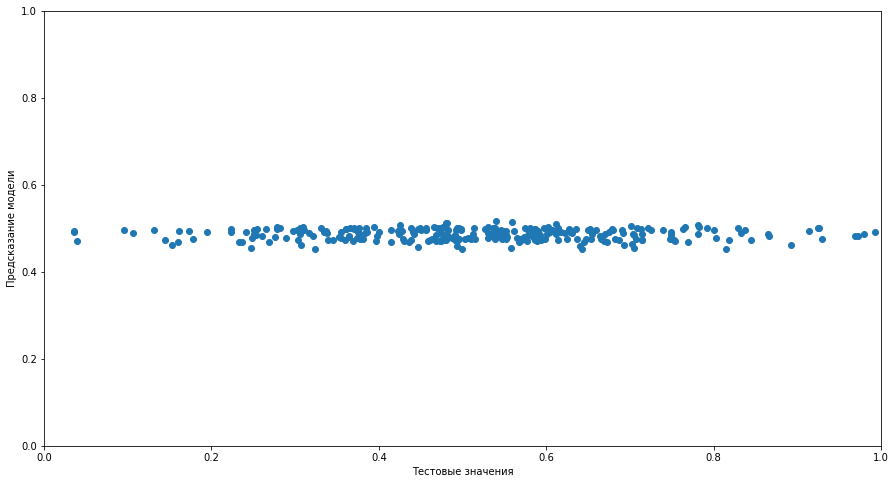

In [100]:
rcParams['figure.figsize'] = 15,8
plt.scatter(y_test_pr, rf_best_pr.predict(X_test_pr))
plt.xlabel("Тестовые значения")
plt.ylabel("Предсказание модели")
limits = [0,1]
plt.xlim(limits)
plt.ylim(limits)

## 4.3 K-Neighbors Regressor

In [101]:
kn = KNeighborsRegressor()
kn_params = {'n_neighbors' : range(1, 301, 2), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }

### Модуль упругости при растяжении - параметры по умолчанию

In [102]:
# обучение с параметрами по умолчанию
kn.fit(X_train_upr, y_train_upr)
y_pred_upr = kn.predict(X_test_upr)
# выведем первые пять значений с помощью диапазона индексов
print(y_pred_upr[:5])

[[0.5514111 ]
 [0.44158204]
 [0.52903787]
 [0.43178633]
 [0.46258119]]


In [103]:
kn_def_upr_result = pd.DataFrame({
   'Model': 'KNeighborsRegressor_default',
   'MSE': metrics.mean_squared_error(y_test_upr, y_pred_upr),
   'MAE': metrics.mean_absolute_error(y_test_upr, y_pred_upr), 
   'R^2': metrics.r2_score(y_test_upr, y_pred_upr)
   }, index=['Модуль упругости при растяжении'])

In [104]:
models = pd.concat([models, kn_def_upr_result])

In [105]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,RandomForestRegressor_best,0.035039,0.147426,-0.034884
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Прочность при растяжении,RandomForestRegressor_default,0.035997,0.152083,-0.063189
Модуль упругости при растяжении,LinearRegression_default,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,LinearRegression_best,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,RandomForestRegressor_default,0.036049,0.154849,-0.041076


### Модуль упругости при растяжении - поиск лучших гиперпараметров

In [106]:
GSCV_kn_best_upr = GridSearchCV(kn, kn_params, n_jobs=-1, cv=10)
GSCV_kn_best_upr.fit(X_train_upr, y_train_upr)
GSCV_kn_best_upr.best_params_

{'algorithm': 'auto', 'n_neighbors': 183, 'weights': 'uniform'}

In [107]:
kn_best_upr = GSCV_kn_best_upr.best_estimator_

In [108]:
kn_best_upr_result = pd.DataFrame({
   'Model': 'KNeighborsRegressor_best', 
   'MSE': metrics.mean_squared_error(y_test_upr, kn_best_upr.predict(X_test_upr)),
   'MAE': metrics.mean_absolute_error(y_test_upr, kn_best_upr.predict(X_test_upr)), 
   'R^2': metrics.r2_score(y_test_upr, kn_best_upr.predict(X_test_upr))
   }, index=['Модуль упругости при растяжении']) 


In [109]:
models = pd.concat([models, kn_best_upr_result])


In [110]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,RandomForestRegressor_best,0.035039,0.147426,-0.034884
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,KNeighborsRegressor_best,0.034724,0.151232,-0.002795
Прочность при растяжении,RandomForestRegressor_default,0.035997,0.152083,-0.063189
Модуль упругости при растяжении,LinearRegression_default,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,LinearRegression_best,0.034808,0.152207,-0.005222


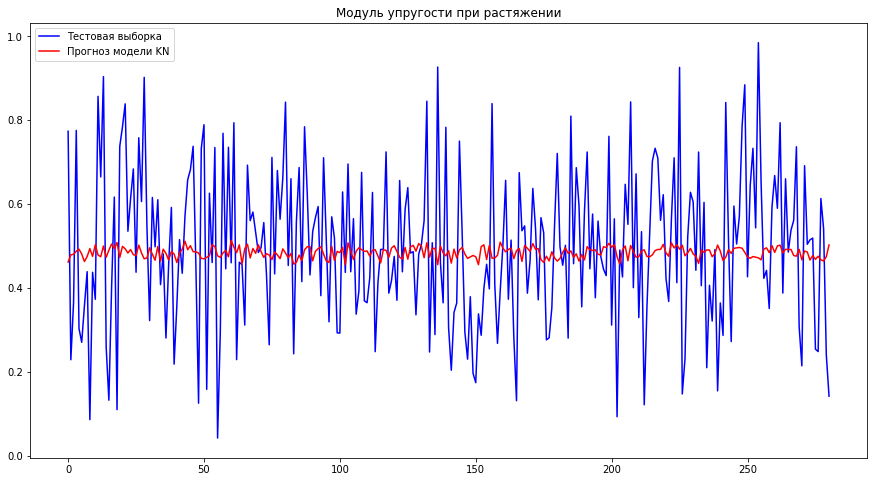

In [111]:
# Визуализация результата
rcParams['figure.figsize'] = 15,8
plt.plot(range(len(y_test_upr)), y_test_upr, label='Тестовая выборка', color = 'b')
plt.plot(range(len(kn_best_upr.predict(X_test_upr))), kn_best_upr.predict(X_test_upr), color = 'r', label='Прогноз модели KN')
plt.title('Модуль упругости при растяжении', fontsize=12)
plt.legend(loc = 2, fontsize = 10)
plt.savefig("model_KN_upr.svg")

(0.0, 1.0)

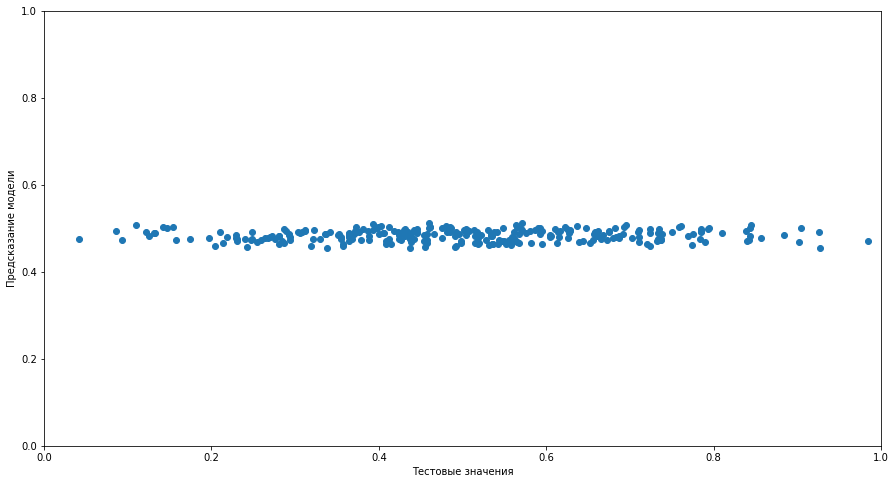

In [112]:
rcParams['figure.figsize'] = 15,8
plt.scatter(y_test_upr, kn_best_upr.predict(X_test_upr))
plt.xlabel("Тестовые значения")
plt.ylabel("Предсказание модели")
limits = [0,1]
plt.xlim(limits)
plt.ylim(limits)

### Прочность при растяжении - параметры по умолчанию

In [113]:
kn.fit(X_train_pr, y_train_pr)
y_pred_pr = kn.predict(X_test_pr)
print(y_pred_pr[:5])

[[0.43531824]
 [0.57073463]
 [0.39600132]
 [0.48398943]
 [0.4069264 ]]


In [114]:
kn_def_pr_result = pd.DataFrame({
   'Model': 'KNeighborsRegressor_default',
   'MSE': metrics.mean_squared_error(y_test_pr, y_pred_pr),
   'MAE': metrics.mean_absolute_error(y_test_pr, y_pred_pr),
   'R^2': metrics.r2_score(y_test_pr, y_pred_pr)
   }, index=['Прочность при растяжении'])

In [115]:
models = pd.concat([models, kn_def_pr_result])

In [116]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,RandomForestRegressor_best,0.035039,0.147426,-0.034884
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,KNeighborsRegressor_best,0.034724,0.151232,-0.002795
Прочность при растяжении,RandomForestRegressor_default,0.035997,0.152083,-0.063189
Модуль упругости при растяжении,LinearRegression_default,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,LinearRegression_best,0.034808,0.152207,-0.005222


### Прочность при растяжении - поиск лучших гиперпараметров

In [117]:
GSCV_kn_best_pr = GridSearchCV(kn, kn_params, n_jobs=-1, cv=10)
GSCV_kn_best_pr.fit(X_train_pr, y_train_pr)
GSCV_kn_best_pr.best_params_

{'algorithm': 'auto', 'n_neighbors': 243, 'weights': 'uniform'}

In [118]:
kn_best_pr = GSCV_kn_best_pr.best_estimator_

In [119]:
kn_best_pr_result = pd.DataFrame({
   'Model': 'KNeighborsRegressor_best', 
   'MSE': metrics.mean_squared_error(y_test_pr, kn_best_pr.predict(X_test_pr)),
   'MAE': metrics.mean_absolute_error(y_test_pr, kn_best_pr.predict(X_test_pr)),
   'R^2': metrics.r2_score(y_test_pr, kn_best_pr.predict(X_test_pr))
   }, index=['Прочность при растяжении']) 

In [120]:
models = pd.concat([models, kn_best_pr_result])

In [121]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,KNeighborsRegressor_best,0.034805,0.146584,-0.027995
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,RandomForestRegressor_best,0.035039,0.147426,-0.034884
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,KNeighborsRegressor_best,0.034724,0.151232,-0.002795
Прочность при растяжении,RandomForestRegressor_default,0.035997,0.152083,-0.063189
Модуль упругости при растяжении,LinearRegression_default,0.034808,0.152207,-0.005222


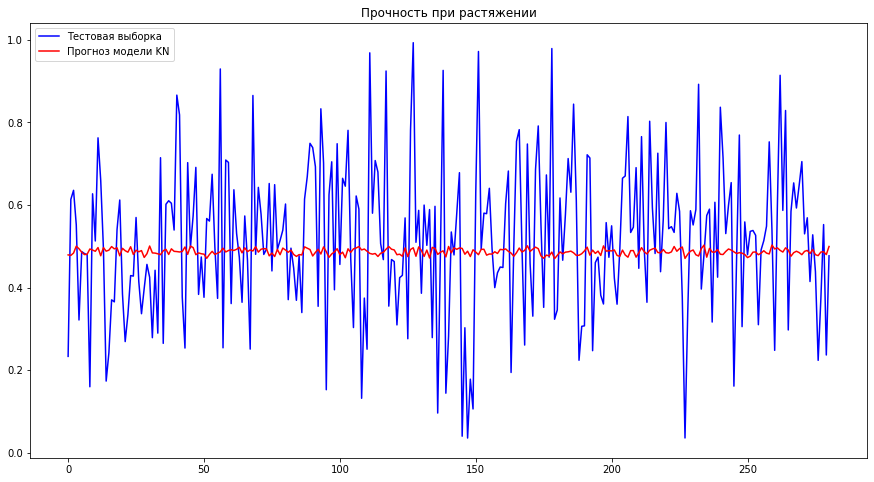

In [122]:
# визуализация результата
rcParams['figure.figsize'] = 15,8
plt.plot(range(len(y_test_pr)), y_test_pr, label='Тестовая выборка', color = 'b')
plt.plot(range(len(kn_best_pr.predict(X_test_pr))), kn_best_pr.predict(X_test_pr), color = 'r', label='Прогноз модели KN')
plt.title('Прочность при растяжении', fontsize=12)
plt.legend(loc = 2, fontsize = 10)
plt.savefig("model_KN_pr.svg")

(0.0, 1.0)

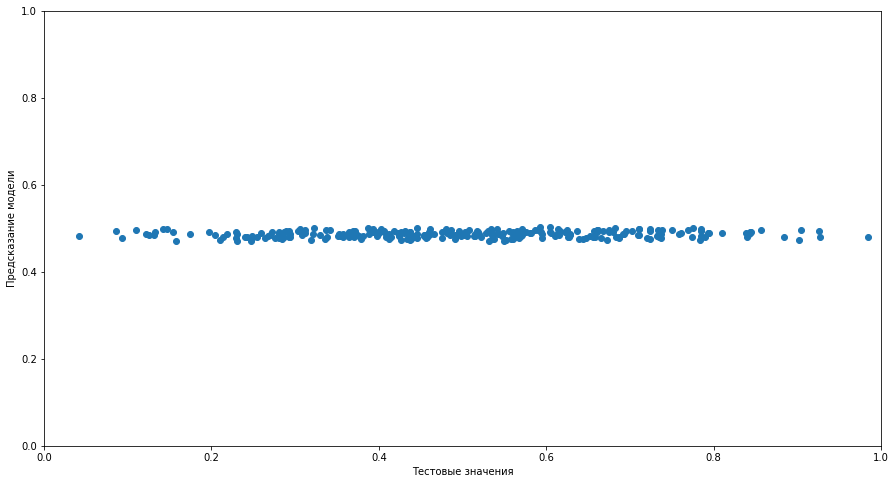

In [123]:
rcParams['figure.figsize'] = 15,8
plt.scatter(y_test_upr, kn_best_pr.predict(X_test_pr))
plt.xlabel("Тестовые значения")
plt.ylabel("Предсказание модели")
limits = [0,1]
plt.xlim(limits)
plt.ylim(limits)

## 4.4 Gradient Boosting Regressor

In [124]:
gb = GradientBoostingRegressor()
gb_params={
    'n_estimators':[100,500],
    'learning_rate': [0.1,0.05,0.02],
    'max_depth':[4],
    'min_samples_leaf':[3],
    'max_features':[1.0]
    } 

### Модуль упругости при растяжении - параметры по умолчанию

In [125]:
# обучение с параметрами по умолчанию
gb.fit(X_train_upr, np.ravel(y_train_upr))
y_pred_upr = gb.predict(X_test_upr)
# выведем первые пять значений с помощью диапазона индексов
print(y_pred_upr[:5])

[0.36619827 0.52733139 0.47271909 0.54487097 0.46067979]


In [126]:
gb_def_upr_result = pd.DataFrame({
   'Model': 'GradientBooster_default', 
   'MSE': metrics.mean_squared_error(y_test_upr, y_pred_upr),
   'MAE': metrics.mean_absolute_error(y_test_upr, y_pred_upr),
   'R^2': metrics.r2_score(y_test_upr, y_pred_upr)
   }, index=['Модуль упругости при растяжении'])

In [127]:
models = pd.concat([models, gb_def_upr_result])

In [128]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,KNeighborsRegressor_best,0.034805,0.146584,-0.027995
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,RandomForestRegressor_best,0.035039,0.147426,-0.034884
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,KNeighborsRegressor_best,0.034724,0.151232,-0.002795
Прочность при растяжении,RandomForestRegressor_default,0.035997,0.152083,-0.063189
Модуль упругости при растяжении,LinearRegression_default,0.034808,0.152207,-0.005222


### Модуль упругости при растяжении - поиск лучших гиперпараметров

In [220]:
GSCV_gb_upr = GridSearchCV(gb, gb_params, cv=10, verbose=0)
GSCV_gb_upr.fit(X_train_upr, np.ravel(y_train_upr))
GSCV_gb_upr.best_params_

{'learning_rate': 0.02,
 'max_depth': 4,
 'max_features': 1.0,
 'min_samples_leaf': 3,
 'n_estimators': 100}

In [130]:
gb_best_upr = GSCV_gb_upr.best_estimator_

In [131]:
gb_best_upr_result = pd.DataFrame({
   'Model': 'GradientBooster_best',
   'MSE': metrics.mean_squared_error(y_test_upr, gb_best_upr.predict(X_test_upr)),
   'MAE': metrics.mean_absolute_error(y_test_upr, gb_best_upr.predict(X_test_upr)), 
   'R^2': metrics.r2_score(y_test_upr, gb_best_upr.predict(X_test_upr))
   }, index=['Модуль упругости при растяжении']) 

In [132]:
models = pd.concat([models, gb_best_upr_result])

In [133]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,KNeighborsRegressor_best,0.034805,0.146584,-0.027995
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,RandomForestRegressor_best,0.035039,0.147426,-0.034884
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,KNeighborsRegressor_best,0.034724,0.151232,-0.002795
Модуль упругости при растяжении,GradientBooster_best,0.035135,0.151845,-0.014684
Прочность при растяжении,RandomForestRegressor_default,0.035997,0.152083,-0.063189


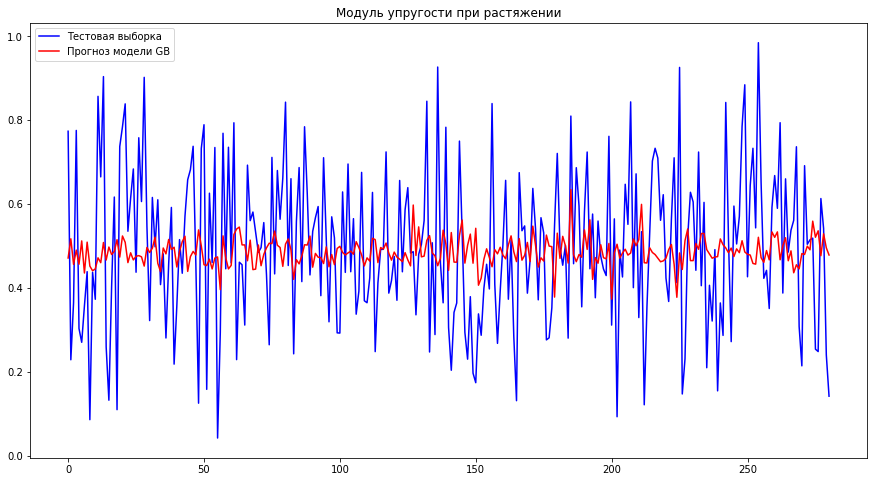

In [134]:
# визуализация результата
rcParams['figure.figsize'] = 15,8
plt.plot(range(len(y_test_upr)), y_test_upr, label='Тестовая выборка', color = 'b')
plt.plot(range(len(gb_best_upr.predict(X_test_upr))), gb_best_upr.predict(X_test_upr), color = 'r', label='Прогноз модели GB')
plt.title('Модуль упругости при растяжении', fontsize=12)
plt.legend(loc = 2, fontsize = 10)
plt.savefig("model_GB_upr.svg")

(0.0, 1.0)

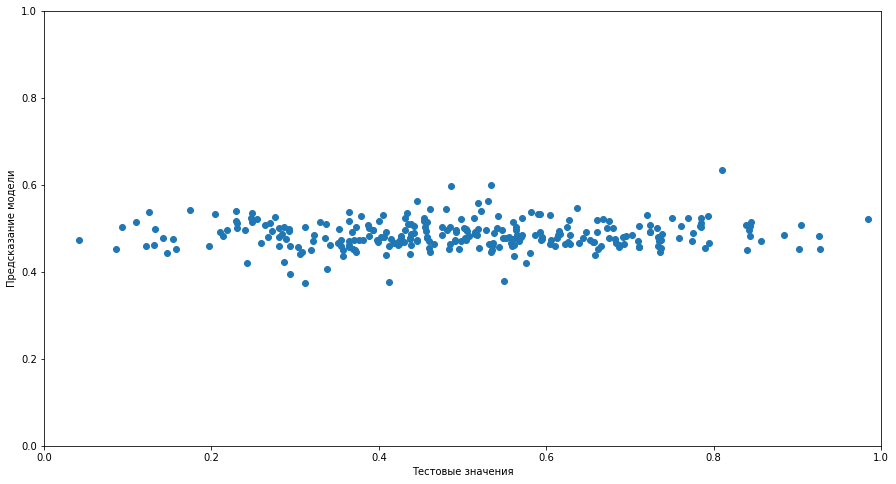

In [135]:
rcParams['figure.figsize'] = 15,8
plt.scatter(y_test_upr, gb_best_upr.predict(X_test_upr))
plt.xlabel("Тестовые значения")
plt.ylabel("Предсказание модели")
limits = [0,1]
plt.xlim(limits)
plt.ylim(limits)

### Прочность при растяжении - параметры по умолчанию

In [136]:
# обучение с параметрами по умолчанию
gb.fit(X_train_pr, np.ravel(y_train_pr))
y_pred_pr = gb.predict(X_test_pr)
# выведем первые пять значений с помощью диапазона индексов
print(y_pred_pr[:5])

[0.44087621 0.43086613 0.55597863 0.51735978 0.48641706]


In [137]:
gb_def_pr_result = pd.DataFrame({
   'Model': 'GradientBooster_default',
   'MSE': metrics.mean_squared_error(y_test_pr, y_pred_pr),
   'MAE': metrics.mean_absolute_error(y_test_pr, y_pred_pr),
   'R^2': metrics.r2_score(y_test_pr, y_pred_pr)
   }, index=['Прочность при растяжении'])

In [138]:
models = pd.concat([models, gb_def_pr_result])

In [139]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,KNeighborsRegressor_best,0.034805,0.146584,-0.027995
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,RandomForestRegressor_best,0.035039,0.147426,-0.034884
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,KNeighborsRegressor_best,0.034724,0.151232,-0.002795
Модуль упругости при растяжении,GradientBooster_best,0.035135,0.151845,-0.014684
Прочность при растяжении,RandomForestRegressor_default,0.035997,0.152083,-0.063189


### Прочность при растяжении - поиск лучших гиперпараметров

In [221]:
GSCV_gb_pr = GridSearchCV(gb, gb_params, cv=10, verbose=0)
GSCV_gb_pr.fit(X_train_pr, np.ravel(y_train_pr))
GSCV_gb_pr.best_params_

{'learning_rate': 0.02,
 'max_depth': 4,
 'max_features': 1.0,
 'min_samples_leaf': 3,
 'n_estimators': 100}

In [141]:
gb_best_pr = GSCV_gb_pr.best_estimator_

In [142]:
gb_best_pr_result = pd.DataFrame({
   'Model': 'GradientBooster_best', 
   'MSE': metrics.mean_squared_error(y_test_pr, gb_best_pr.predict(X_test_pr)),
   'MAE': metrics.mean_absolute_error(y_test_pr, gb_best_pr.predict(X_test_pr)),
   'R^2': metrics.r2_score(y_test_pr, gb_best_pr.predict(X_test_pr))
   }, index=['Прочность при растяжении']) 

In [143]:
models = pd.concat([models, gb_best_pr_result])

In [144]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,KNeighborsRegressor_best,0.034805,0.146584,-0.027995
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,RandomForestRegressor_best,0.035039,0.147426,-0.034884
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Прочность при растяжении,GradientBooster_best,0.035680,0.150019,-0.053820
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,KNeighborsRegressor_best,0.034724,0.151232,-0.002795
Модуль упругости при растяжении,GradientBooster_best,0.035135,0.151845,-0.014684


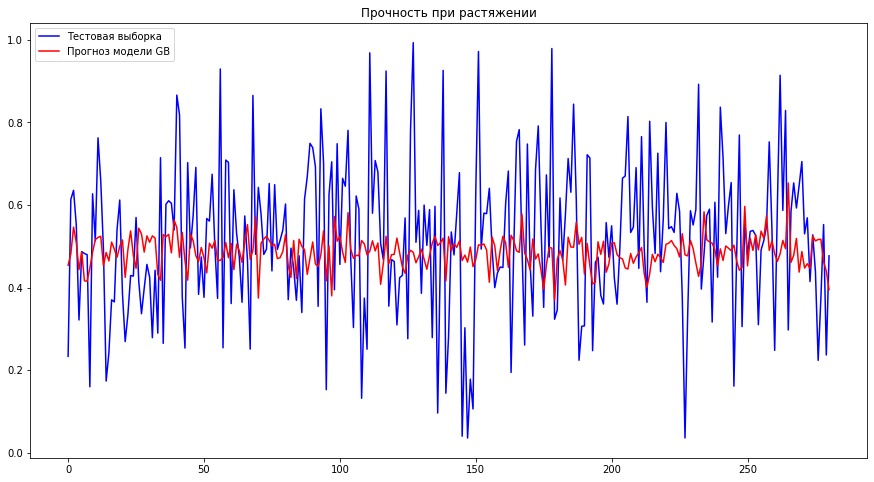

In [145]:
# визуализация результата
rcParams['figure.figsize'] = 15,8
plt.plot(range(len(y_test_pr)), y_test_pr, label='Тестовая выборка', color = 'b')
plt.plot(range(len(gb_best_pr.predict(X_test_pr))), gb_best_pr.predict(X_test_pr), color = 'r', label='Прогноз модели GB')
plt.title('Прочность при растяжении', fontsize=12)
plt.legend(loc = 2, fontsize = 10)
plt.savefig("model_GB_pr.svg")

(0.0, 1.0)

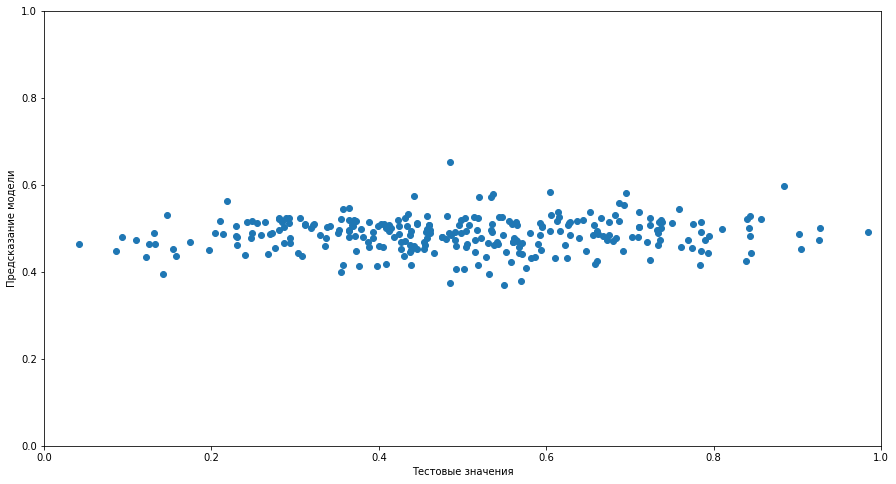

In [146]:
rcParams['figure.figsize'] = 15,8
plt.scatter(y_test_upr, gb_best_pr.predict(X_test_pr))
plt.xlabel("Тестовые значения")
plt.ylabel("Предсказание модели")
limits = [0,1]
plt.xlim(limits)
plt.ylim(limits)

## 4.5 Multilayered perceptron (MLP)

In [147]:
mlp = MLPRegressor(random_state=RANDOM_STATE, verbose=True)
mlp_params = {
    'hidden_layer_sizes' : [(64, 32, 12),
                            (12, 12, 12, 12, 12),
                            (32, 32, 16, 8),
                            (16, 16, 8)],
               'activation' : ['identity', 'logistic', 'tanh', 'relu'],
               'solver' : ['adam', 'lbfgs', 'sgd'],
               'max_iter' : [300],
               'learning_rate' : ['constant', 'adaptive', 'invscaling']
               }

### Модуль упругости при растяжении - параметры по умолчанию

In [148]:
# обучение с параметрами по умолчанию
mlp.fit(X_train_upr, np.ravel(y_train_upr))
y_pred_upr = mlp.predict(X_test_upr)
# выведем первые пять значений с помощью диапазона индексов
print(y_pred_upr[:5])

Iteration 1, loss = 0.16759028
Iteration 2, loss = 0.08562663
Iteration 3, loss = 0.04069881
Iteration 4, loss = 0.02806836
Iteration 5, loss = 0.03310262
Iteration 6, loss = 0.03643119
Iteration 7, loss = 0.03220143
Iteration 8, loss = 0.02694787
Iteration 9, loss = 0.02477613
Iteration 10, loss = 0.02486948
Iteration 11, loss = 0.02490888
Iteration 12, loss = 0.02417044
Iteration 13, loss = 0.02337133
Iteration 14, loss = 0.02290687
Iteration 15, loss = 0.02279677
Iteration 16, loss = 0.02263638
Iteration 17, loss = 0.02235626
Iteration 18, loss = 0.02207765
Iteration 19, loss = 0.02189398
Iteration 20, loss = 0.02169918
Iteration 21, loss = 0.02147037
Iteration 22, loss = 0.02129245
Iteration 23, loss = 0.02117137
Iteration 24, loss = 0.02095371
Iteration 25, loss = 0.02085098
Iteration 26, loss = 0.02074219
Iteration 27, loss = 0.02060983
Iteration 28, loss = 0.02050062
Iteration 29, loss = 0.02036080
Iteration 30, loss = 0.02024706
Iteration 31, loss = 0.02013313
Iteration 32, los

In [149]:
mlp_def_upr_result = pd.DataFrame({
   'Model': 'MLPRegressor_default', 
   'MSE': metrics.mean_squared_error(y_test_upr, y_pred_upr),
   'MAE': metrics.mean_absolute_error(y_test_upr, y_pred_upr),
   'R^2': metrics.r2_score(y_test_upr, y_pred_upr)
   }, index=['Модуль упругости при растяжении'])

In [150]:
models = pd.concat([models, mlp_def_upr_result])

In [151]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,KNeighborsRegressor_best,0.034805,0.146584,-0.027995
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,RandomForestRegressor_best,0.035039,0.147426,-0.034884
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Прочность при растяжении,GradientBooster_best,0.035680,0.150019,-0.053820
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,KNeighborsRegressor_best,0.034724,0.151232,-0.002795
Модуль упругости при растяжении,GradientBooster_best,0.035135,0.151845,-0.014684


### Модуль упругости при растяжении - поиск лучших гиперпараметров

In [152]:
GSCV_mlp_upr = GridSearchCV(mlp, mlp_params, n_jobs=-1, cv=10)
GSCV_mlp_upr.fit(X_train_upr, np.ravel(y_train_upr))
GSCV_mlp_upr.best_params_

{'activation': 'logistic',
 'hidden_layer_sizes': (64, 32, 12),
 'learning_rate': 'constant',
 'max_iter': 300,
 'solver': 'lbfgs'}

In [153]:
mlp_best_upr = GSCV_mlp_upr.best_estimator_

In [154]:
mlp_best_upr_result = pd.DataFrame({
   'Model': 'MLPRegressor_best', 
   'MSE': metrics.mean_squared_error(y_test_upr, mlp_best_upr.predict(X_test_upr)),
   'MAE': metrics.mean_absolute_error(y_test_upr, mlp_best_upr.predict(X_test_upr)), 
   'R^2': metrics.r2_score(y_test_upr, mlp_best_upr.predict(X_test_upr))
   }, index=['Модуль упругости при растяжении']) 


In [155]:
models = pd.concat([models, mlp_best_upr_result])

In [156]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,KNeighborsRegressor_best,0.034805,0.146584,-0.027995
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,RandomForestRegressor_best,0.035039,0.147426,-0.034884
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Прочность при растяжении,GradientBooster_best,0.035680,0.150019,-0.053820
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,MLPRegressor_best,0.034835,0.151209,-0.005994
Модуль упругости при растяжении,KNeighborsRegressor_best,0.034724,0.151232,-0.002795


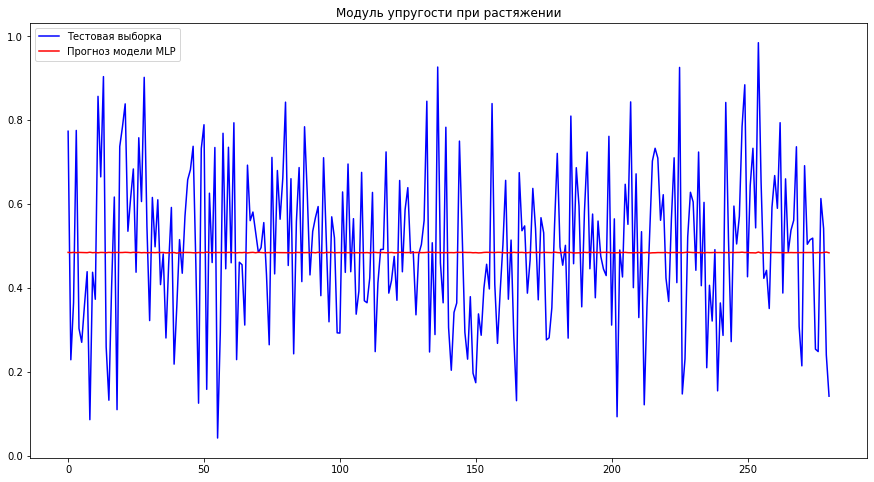

In [157]:
# визуализация результата
rcParams['figure.figsize'] = 15,8
plt.plot(range(len(y_test_upr)), y_test_upr, label='Тестовая выборка', color = 'b')
plt.plot(range(len(mlp_best_upr.predict(X_test_upr))), mlp_best_upr.predict(X_test_upr), color = 'r', label='Прогноз модели MLP')
plt.title('Модуль упругости при растяжении', fontsize=12)
plt.legend(loc = 2, fontsize = 10)
plt.savefig("model_MLP_upr.svg")

(0.0, 1.0)

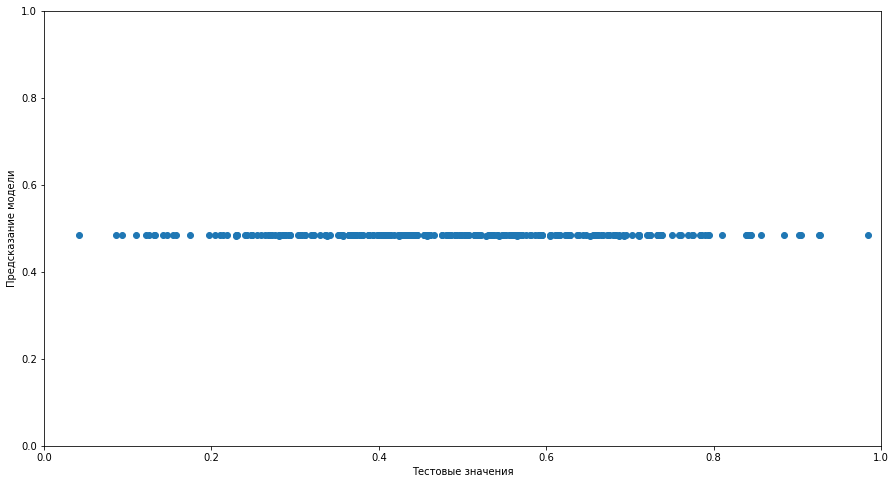

In [158]:
rcParams['figure.figsize'] = 15,8
plt.scatter(y_test_upr, mlp_best_upr.predict(X_test_upr))
plt.xlabel("Тестовые значения")
plt.ylabel("Предсказание модели")
limits = [0,1]
plt.xlim(limits)
plt.ylim(limits)

### Прочность при растяжении - параметры по умолчанию

In [159]:
# обучение с параметрами по умолчанию
mlp.fit(X_train_pr, np.ravel(y_train_pr))
y_pred_upr = mlp.predict(X_test_pr)
# выведем первые пять значений с помощью диапазона индексов
print(y_pred_pr[:5])

Iteration 1, loss = 0.16842253
Iteration 2, loss = 0.08635313
Iteration 3, loss = 0.04108498
Iteration 4, loss = 0.02906211
Iteration 5, loss = 0.03297694
Iteration 6, loss = 0.03589460
Iteration 7, loss = 0.03184256
Iteration 8, loss = 0.02665186
Iteration 9, loss = 0.02442731
Iteration 10, loss = 0.02449959
Iteration 11, loss = 0.02472312
Iteration 12, loss = 0.02406174
Iteration 13, loss = 0.02311948
Iteration 14, loss = 0.02264228
Iteration 15, loss = 0.02251088
Iteration 16, loss = 0.02242244
Iteration 17, loss = 0.02215519
Iteration 18, loss = 0.02186466
Iteration 19, loss = 0.02180275
Iteration 20, loss = 0.02170057
Iteration 21, loss = 0.02150512
Iteration 22, loss = 0.02126998
Iteration 23, loss = 0.02111232
Iteration 24, loss = 0.02098950
Iteration 25, loss = 0.02087058
Iteration 26, loss = 0.02073976
Iteration 27, loss = 0.02065553
Iteration 28, loss = 0.02048949
Iteration 29, loss = 0.02033882
Iteration 30, loss = 0.02024437
Iteration 31, loss = 0.02012197
Iteration 32, los

In [160]:
mlp_def_pr_result = pd.DataFrame({
   'Model': 'MLPRegressor_default', 
   'MSE': metrics.mean_squared_error(y_test_pr, y_pred_pr),
   'MAE': metrics.mean_absolute_error(y_test_pr, y_pred_pr),
   'R^2': metrics.r2_score(y_test_pr, y_pred_pr)
   }, index=['Прочность при растяжении'])

In [161]:
models = pd.concat([models, mlp_def_pr_result])

In [162]:
models_sort = models.sort_values(by=['MAE', 'R^2'])
models_sort

,Model,MSE,MAE,R^2
Прочность при растяжении,KNeighborsRegressor_best,0.034805,0.146584,-0.027995
Прочность при растяжении,DummyRegression_mean,0.034862,0.146748,-0.029672
Прочность при растяжении,RandomForestRegressor_best,0.035039,0.147426,-0.034884
Прочность при растяжении,LinearRegression_default,0.035449,0.147903,-0.046999
Прочность при растяжении,LinearRegression_best,0.035449,0.147903,-0.046999
Прочность при растяжении,GradientBooster_best,0.035680,0.150019,-0.053820
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,MLPRegressor_best,0.034835,0.151209,-0.005994
Модуль упругости при растяжении,KNeighborsRegressor_best,0.034724,0.151232,-0.002795


### Прочность при растяжении - поиск лучших гиперпараметров

In [163]:
GSCV_mlp_pr = GridSearchCV(mlp, mlp_params, n_jobs=-1, cv=10)
GSCV_mlp_pr.fit(X_train_pr, np.ravel(y_train_pr))
GSCV_mlp_pr.best_params_

Iteration 1, loss = 0.10327948
Iteration 2, loss = 0.07318591
Iteration 3, loss = 0.05045150
Iteration 4, loss = 0.03439713
Iteration 5, loss = 0.02463051
Iteration 6, loss = 0.01972795
Iteration 7, loss = 0.01822894
Iteration 8, loss = 0.01837241
Iteration 9, loss = 0.01897242
Iteration 10, loss = 0.01921805
Iteration 11, loss = 0.01904391
Iteration 12, loss = 0.01863798
Iteration 13, loss = 0.01829859
Iteration 14, loss = 0.01815286
Iteration 15, loss = 0.01806487
Iteration 16, loss = 0.01809820
Iteration 17, loss = 0.01815987
Iteration 18, loss = 0.01815392
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.


{'activation': 'logistic',
 'hidden_layer_sizes': (64, 32, 12),
 'learning_rate': 'constant',
 'max_iter': 300,
 'solver': 'adam'}

In [164]:
mlp_best_pr = GSCV_mlp_pr.best_estimator_

In [165]:
mlp_best_pr_result = pd.DataFrame({
   'Model': 'MLPRegressor_best', 
   'MSE': metrics.mean_squared_error(y_test_pr, mlp_best_pr.predict(X_test_pr)),
   'MAE': metrics.mean_absolute_error(y_test_pr, mlp_best_pr.predict(X_test_pr)),
   'R^2': metrics.r2_score(y_test_pr, mlp_best_pr.predict(X_test_pr))
   }, index=['Прочность при растяжении']) 

In [166]:
models = pd.concat([models, mlp_best_pr_result])

In [167]:
#models_sort = models.sort_values(by=['MAE', 'R^2'])
#models_sort
models_sort = models.sort_index()
models_sort

,Model,MSE,MAE,R^2
Модуль упругости при растяжении,DummyRegression_mean,0.034832,0.151202,-0.005930
Модуль упругости при растяжении,MLPRegressor_best,0.034835,0.151209,-0.005994
Модуль упругости при растяжении,MLPRegressor_default,0.036425,0.156268,-0.051938
Модуль упругости при растяжении,GradientBooster_best,0.035135,0.151845,-0.014684
Модуль упругости при растяжении,GradientBooster_default,0.037769,0.155943,-0.090727
Модуль упругости при растяжении,KNeighborsRegressor_best,0.034724,0.151232,-0.002795
Модуль упругости при растяжении,RandomForestRegressor_best,0.034667,0.150828,-0.001151
Модуль упругости при растяжении,KNeighborsRegressor_default,0.041694,0.166480,-0.204103
Модуль упругости при растяжении,LinearRegression_best,0.034808,0.152207,-0.005222
Модуль упругости при растяжении,LinearRegression_default,0.034808,0.152207,-0.005222


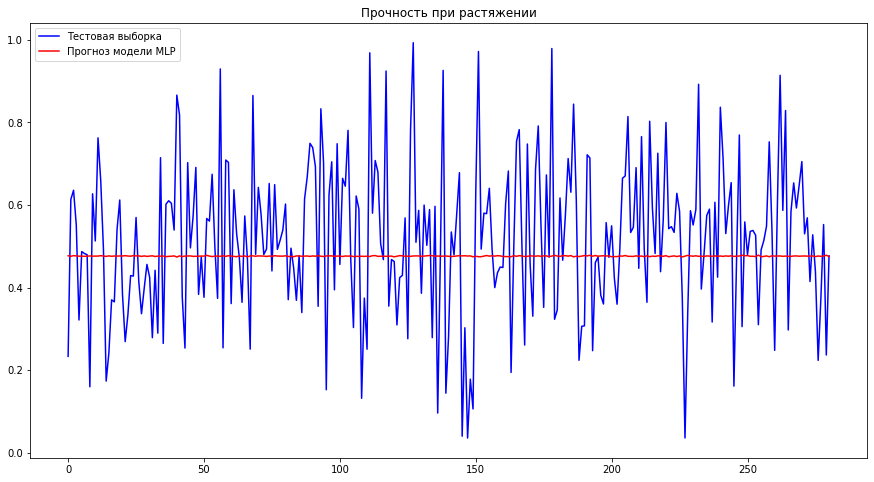

In [168]:
# визуализация результата
rcParams['figure.figsize'] = 15,8
plt.plot(range(len(y_test_pr)), y_test_pr, label='Тестовая выборка', color = 'b')
plt.plot(range(len(mlp_best_pr.predict(X_test_pr))), mlp_best_pr.predict(X_test_pr), color = 'r', label='Прогноз модели MLP')
plt.title('Прочность при растяжении', fontsize=12)
plt.legend(loc = 2, fontsize = 10)
plt.savefig("model_MLP_pr.svg")

(0.0, 1.0)

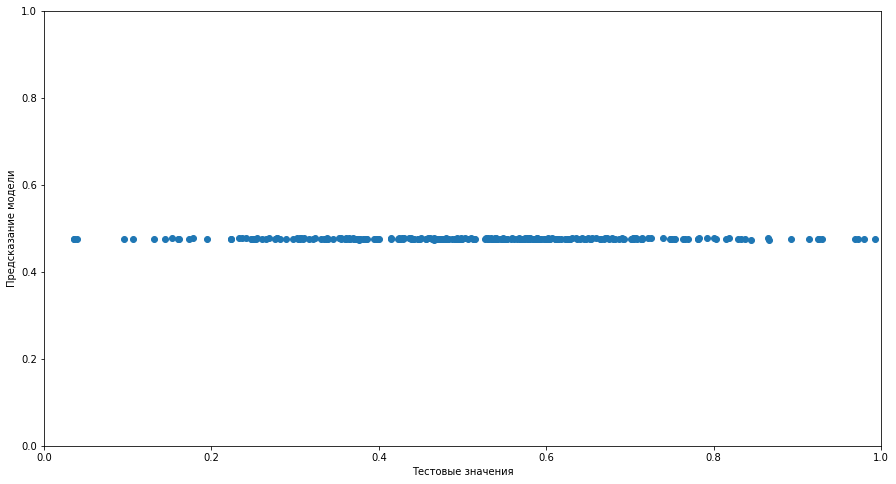

In [169]:
rcParams['figure.figsize'] = 15,8
plt.scatter(y_test_pr, mlp_best_pr.predict(X_test_pr))
plt.xlabel("Тестовые значения")
plt.ylabel("Предсказание модели")
limits = [0,1]
plt.xlim(limits)
plt.ylim(limits)

## 4.6 Диаграммы полученных метрик

Text(0.5, 1.0, 'Средняя абсолютная ошибка моделей прогноза Модуля упругости при растяжении')

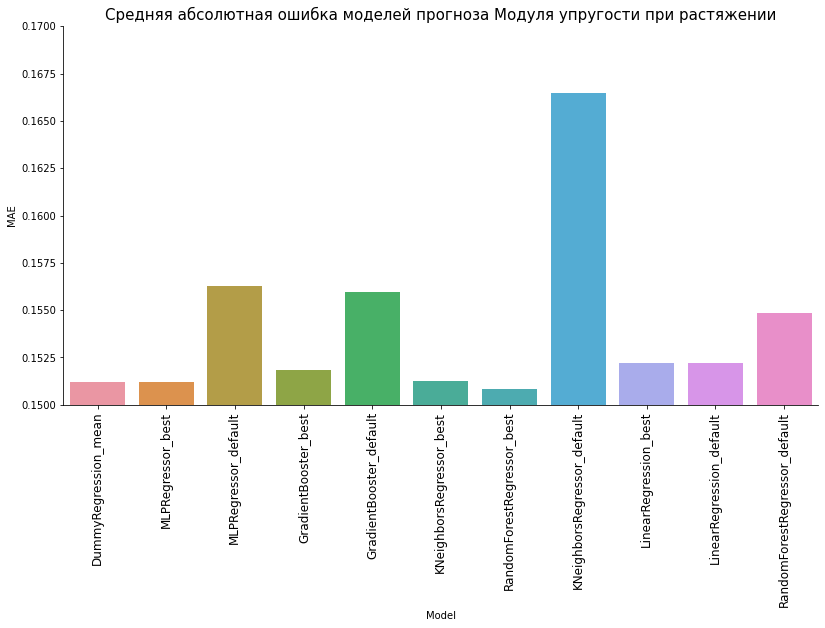

In [170]:
sns.catplot(data=models_sort[0:11], x='Model', y='MAE', kind='bar', ci=None, height=6, aspect=2)
plt.ylim(ymin=0.15, ymax=0.17)
plt.xticks(rotation=90, size=12)
plt.title('Средняя абсолютная ошибка моделей прогноза Модуля упругости при растяжении', size=15)

Text(0.5, 1.0, 'Коэффициент детерминации прогноза Модуля упругости при растяжении')

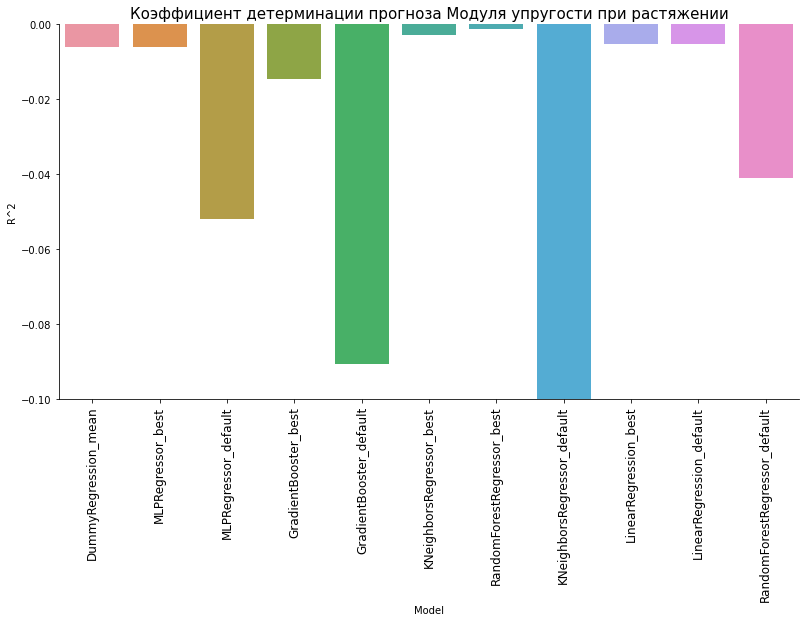

In [171]:
sns.catplot(data=models_sort[0:11], x='Model', y='R^2', kind='bar', ci=None, height=6, aspect=2)
plt.ylim(ymin=-0.1, ymax=0.0)
plt.xticks(rotation=90, size=12)
plt.title('Коэффициент детерминации прогноза Модуля упругости при растяжении', size=15)

Text(0.5, 1.0, 'Средняя абсолютная ошибка моделей прогноза Прочности при растяжении')

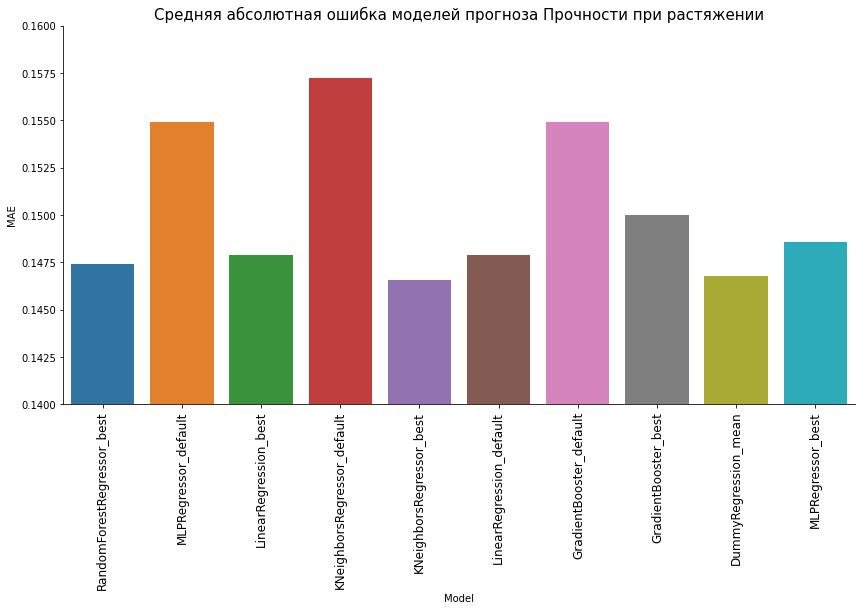

In [172]:
sns.catplot(data=models_sort[12:23], x='Model', y='MAE', kind='bar', height=6, aspect=2)
plt.ylim(ymin=0.14, ymax=0.16)
plt.xticks(rotation=90, size=12)
plt.title('Средняя абсолютная ошибка моделей прогноза Прочности при растяжении', size=15)

Text(0.5, 1.0, 'Коэффициент детерминации прогноза Модуля упругости при растяжении')

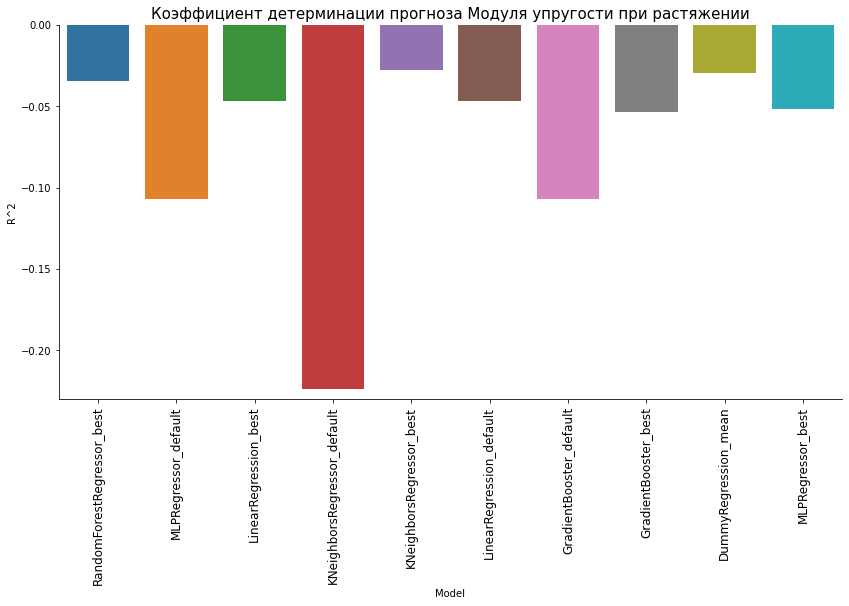

In [173]:
sns.catplot(data=models_sort[12:23], x='Model', y='R^2', kind='bar', ci=None, height=6, aspect=2)
plt.ylim(ymin=-0.23, ymax=0.0)
plt.xticks(rotation=90, size=12)
plt.title('Коэффициент детерминации прогноза Модуля упругости при растяжении', size=15)

# 5. Нейронные сети для соотношения матрица-наполнитель


In [174]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Sequential
from tensorflow.keras import optimizers
from tensorflow.keras.layers import Dense, BatchNormalization, LeakyReLU, Activation, Dropout, LSTM
from keras.callbacks import EarlyStopping, ModelCheckpoint
print(tf.__version__)

2.8.2


In [175]:
X = df.drop(['Соотношение матрица-наполнитель'], axis=1)
y = df[['Соотношение матрица-наполнитель']]
# Разделяем на тренировочную и тестовую выборку
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=RANDOM_STATE)
print('X_train:', X_train.shape, 'y_train:', y_train.shape)
print('X_test:', X_test.shape, 'y_test:', y_test.shape)

X_train: (655, 12) y_train: (655, 1)
X_test: (281, 12) y_test: (281, 1)


In [176]:
# Нормализация входных переменных
#X_test_nw = StandardScaler().fit_transform(X_test)
#X_train_nw = StandardScaler().fit_transform(X_train)
X_test_nw = MinMaxScaler().fit_transform(X_test)
X_train_nw = MinMaxScaler().fit_transform(X_train)

In [177]:
# Выходная переменная преобразованиям не подвергается
y_train_nw = y_train['Соотношение матрица-наполнитель'].values
y_test_nw = y_test['Соотношение матрица-наполнитель'].values

In [178]:
X_train_nw

array([[0.85860568, 0.43659451, 0.15682133, ..., 0.        , 0.33292725,
        0.87291228],
       [0.5327882 , 0.38288983, 0.64794406, ..., 1.        , 0.85682042,
        0.45065527],
       [0.51129937, 0.38662811, 0.68789602, ..., 1.        , 0.28953644,
        0.26957264],
       ...,
       [0.18922181, 0.66300353, 0.37838638, ..., 1.        , 0.41631083,
        0.42265681],
       [0.69806196, 0.29402538, 0.74121985, ..., 0.        , 0.36665085,
        0.34317567],
       [0.33606043, 0.34102167, 0.68809491, ..., 0.        , 0.31878354,
        0.96800026]])

In [179]:
normalizer = tf.keras.layers.Normalization(axis=-1)

In [180]:
# Функция, собирающая нейросеть заданной архитектуры
def construct_model():
    return tf.keras.Sequential([
      keras.layers.Input(shape=(12,), name='in'),                   
      keras.layers.Dense(units=64, activation='relu', name='dense_1'),
      keras.layers.Dense(units=32, activation='relu', name='dense_2'),
      keras.layers.Dense(units=12, activation='relu', name='dense_3'),
      keras.layers.Dense(units=1, name='out')                        
    ])

In [181]:
# Функция, компилирующая нейросеть с заданными параметрами
def compile_model(model):
    model.compile(
#             optimizer=keras.optimizers.SGD(),
             optimizer=keras.optimizers.Adam(),
             loss=keras.losses.MeanAbsolutePercentageError(),
             metrics=[tf.keras.metrics.RootMeanSquaredError()]
             )
    return model

In [182]:
# Функция для построения графика ошибки
def plot_loss(history):
  fig, axes = plt.subplots(1, 2, figsize=(12, 5))
  axes[0].plot(history['loss'], label='loss')
  axes[0].plot(history['val_loss'], label='val_loss')
  axes[0].set_xlabel('Эпоха')
  axes[0].set_ylabel('MAPE')
  axes[0].legend()
  axes[0].grid(True)
  axes[1].plot(history['root_mean_squared_error'], label='loss')
  axes[1].plot(history['val_root_mean_squared_error'], label='val_loss')
  axes[1].set_xlabel('Эпоха')
  axes[1].set_ylabel('RMSE')
  axes[1].legend()
  axes[1].grid(True)
  plt.show()

In [183]:
# Функция для построения рассеяния
def actual_and_predicted_scatter(original_y, predicted_y):
    plt.figure(figsize=(10,5))
    plt.title('Рассеяние тестовых и прогнозных значений', size=15)
    plt.scatter(original_y, predicted_y)
    plt.xlabel('Тестовые значения', size=12)
    plt.ylabel('Прогнозные значения', size=12)
    plt.show()

In [184]:
# Базовая модель
base_model = DummyRegressor(strategy='mean')
# Предсказание базовой модели для соотношения матрица-наполнитель
base_model.fit(X_train_nw, y_train_nw)
y_pred_base = base_model.predict(X_test_nw)

## 5.1 Нейросеть (стандарт)

In [185]:
# cборка
model_1 = construct_model()

In [186]:
# компиляция
model_1 = compile_model(model_1)

In [187]:
# сводная информация по архитектуре сети
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 64)                832       
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 12)                396       
                                                                 
 out (Dense)                 (None, 1)                 13        
                                                                 
Total params: 3,321
Trainable params: 3,321
Non-trainable params: 0
_________________________________________________________________


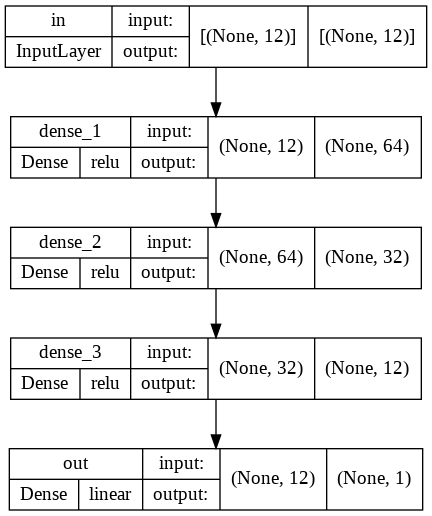

In [188]:
# архитектура нейросети
keras.utils.plot_model(model_1, show_shapes=True, show_layer_names=True, show_layer_activations=True)

In [189]:
%%time
#обучение нейросети
history_1 = model_1.fit(
  X_train_nw, 
  y_train_nw, 
  epochs=300, 
  validation_split=0.3, 
  verbose=1
)

Epoch 1/300
15/15 [==============================] - 1s 18ms/step - loss: 81.9949 - root_mean_squared_error: 2.6599 - val_loss: 57.3822 - val_root_mean_squared_error: 1.9918
Epoch 2/300
15/15 [==============================] - 0s 4ms/step - loss: 42.0479 - root_mean_squared_error: 1.5826 - val_loss: 32.1692 - val_root_mean_squared_error: 1.0033
Epoch 3/300
15/15 [==============================] - 0s 5ms/step - loss: 33.2342 - root_mean_squared_error: 0.9768 - val_loss: 32.4415 - val_root_mean_squared_error: 0.9677
Epoch 4/300
15/15 [==============================] - 0s 4ms/step - loss: 31.1409 - root_mean_squared_error: 1.0492 - val_loss: 31.4081 - val_root_mean_squared_error: 1.0619
Epoch 5/300
15/15 [==============================] - 0s 4ms/step - loss: 30.9338 - root_mean_squared_error: 1.0622 - val_loss: 31.4158 - val_root_mean_squared_error: 0.9918
Epoch 6/300
15/15 [==============================] - 0s 4ms/step - loss: 30.7332 - root_mean_squared_error: 0.9936 - val_loss: 31.4686

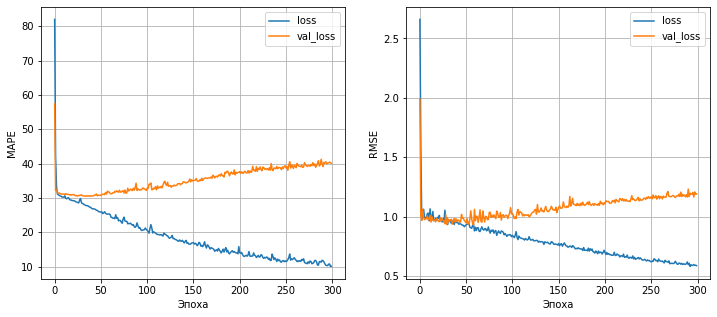

In [190]:
plot_loss(history_1.history)

In [191]:
# точность нейросети на тестовых данных
model_1.evaluate(X_test_nw, y_test_nw)


9/9 [==============================] - 0s 3ms/step - loss: 36.8104 - root_mean_squared_error: 1.1640


[36.81037139892578, 1.1640108823776245]

In [192]:
# предсказание 
y_pred_keras1 = model_1.predict(X_test_nw)

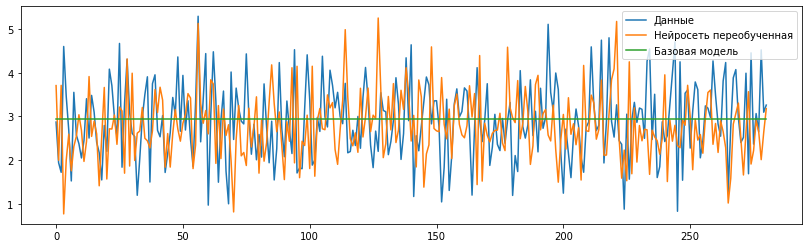

In [193]:
fig, ax = plt.subplots(figsize=(14, 4))
ax.plot(y_test_nw, label='Данные')
ax.plot(y_pred_keras1, label='Нейросеть переобученная')
ax.plot(y_pred_base, label='Базовая модель')
ax.legend()
plt.show()

In [194]:
original_1 = y_test_nw
predicted_1 = y_pred_keras1


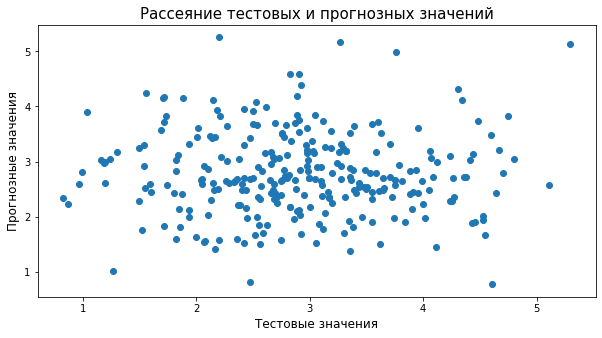

In [195]:
actual_and_predicted_scatter(original_1, predicted_1)

## 5.2 Ранняя остановка процесса обучения (для борьбы с переобучением)

In [196]:
# модель с той же архитектурой
model_2 = construct_model()
model_2 = compile_model(model_2)

In [197]:
%%time
#обучение
history_2 = model_2.fit(
  X_train_nw, 
  y_train_nw, 
  epochs=300, 
  validation_split=0.3, 
  verbose=1,
  callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)]
)

Epoch 1/300
15/15 [==============================] - 1s 14ms/step - loss: 78.2701 - root_mean_squared_error: 2.5725 - val_loss: 53.9253 - val_root_mean_squared_error: 1.9069
Epoch 2/300
15/15 [==============================] - 0s 5ms/step - loss: 41.5669 - root_mean_squared_error: 1.4851 - val_loss: 35.5084 - val_root_mean_squared_error: 1.0203
Epoch 3/300
15/15 [==============================] - 0s 4ms/step - loss: 34.0243 - root_mean_squared_error: 1.0252 - val_loss: 32.4137 - val_root_mean_squared_error: 1.0154
Epoch 4/300
15/15 [==============================] - 0s 5ms/step - loss: 31.4901 - root_mean_squared_error: 1.0729 - val_loss: 31.4759 - val_root_mean_squared_error: 1.0247
Epoch 5/300
15/15 [==============================] - 0s 4ms/step - loss: 30.9700 - root_mean_squared_error: 1.0162 - val_loss: 31.3167 - val_root_mean_squared_error: 0.9810
Epoch 6/300
15/15 [==============================] - 0s 5ms/step - loss: 30.7465 - root_mean_squared_error: 1.0163 - val_loss: 31.0025

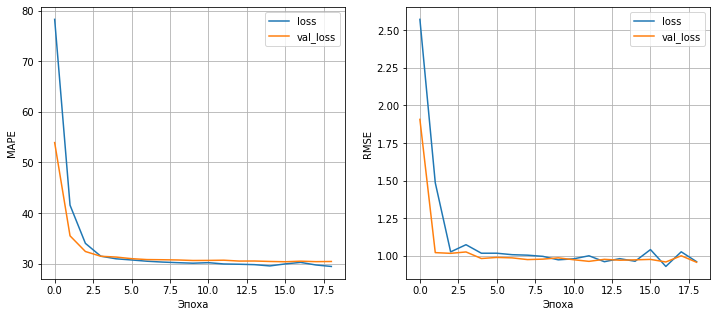

In [198]:
plot_loss(history_2.history)

In [199]:
# точность нейросети на тестовых данных
model_2.evaluate(X_test_nw, y_test_nw)

9/9 [==============================] - 0s 2ms/step - loss: 28.2948 - root_mean_squared_error: 0.9268


[28.294803619384766, 0.9267977476119995]

In [200]:
# предсказание 
y_pred_keras2 = model_2.predict(X_test_nw)

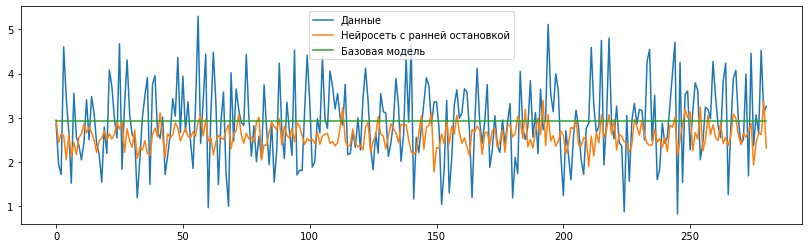

In [201]:
fig, ax = plt.subplots(figsize=(14, 4))
ax.plot(y_test_nw, label='Данные')
ax.plot(y_pred_keras2, label='Нейросеть с ранней остановкой')
ax.plot(y_pred_base, label='Базовая модель')
ax.legend()
plt.show()

In [202]:
original_2 = y_test_nw
predicted_2 = y_pred_keras2


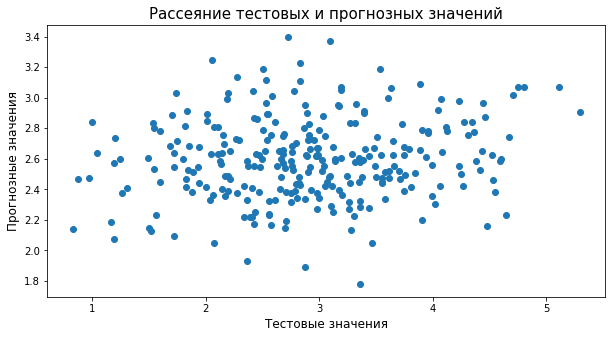

In [203]:
actual_and_predicted_scatter(original_2, predicted_2)

## 5.3 Добавление Dropout-слоя

In [204]:
# построение аналогичной модели с Dropout слоем
model_3 = tf.keras.Sequential([
      keras.layers.Input(shape=(12,), name='in'),                   
      keras.layers.Dense(units=64, activation='relu', name='dense_1'),
      keras.layers.Dropout(0.05, name='dropout_1'),
      keras.layers.Dense(units=32, activation='relu', name='dense_2'),
      keras.layers.Dropout(0.05, name='dropout_2'),
      keras.layers.Dense(units=12, activation='relu', name='dense_3'),
      keras.layers.Dropout(0.05, name='dropout_3'),
      keras.layers.Dense(units=1, name='out')                        
    ])

In [205]:
# компиляция модели
model_3 = compile_model(model_3)

In [206]:
# архитектура изменилась
model_3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 64)                832       
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dropout_2 (Dropout)         (None, 32)                0         
                                                                 
 dense_3 (Dense)             (None, 12)                396       
                                                                 
 dropout_3 (Dropout)         (None, 12)                0         
                                                                 
 out (Dense)                 (None, 1)                

In [207]:
%%time
#обучение
history_3 = model_3.fit(
  X_train_nw, 
  y_train_nw, 
  epochs=300, 
  validation_split=0.3, 
  verbose=1
)

Epoch 1/300
15/15 [==============================] - 1s 14ms/step - loss: 83.0240 - root_mean_squared_error: 2.6770 - val_loss: 59.6129 - val_root_mean_squared_error: 2.0579
Epoch 2/300
15/15 [==============================] - 0s 4ms/step - loss: 45.5733 - root_mean_squared_error: 1.6610 - val_loss: 32.2117 - val_root_mean_squared_error: 1.0098
Epoch 3/300
15/15 [==============================] - 0s 5ms/step - loss: 34.6112 - root_mean_squared_error: 1.0804 - val_loss: 32.1842 - val_root_mean_squared_error: 0.9813
Epoch 4/300
15/15 [==============================] - 0s 4ms/step - loss: 34.4281 - root_mean_squared_error: 1.1734 - val_loss: 31.3474 - val_root_mean_squared_error: 1.0537
Epoch 5/300
15/15 [==============================] - 0s 5ms/step - loss: 32.8370 - root_mean_squared_error: 1.1100 - val_loss: 31.3740 - val_root_mean_squared_error: 0.9686
Epoch 6/300
15/15 [==============================] - 0s 4ms/step - loss: 32.6921 - root_mean_squared_error: 1.0811 - val_loss: 30.8436

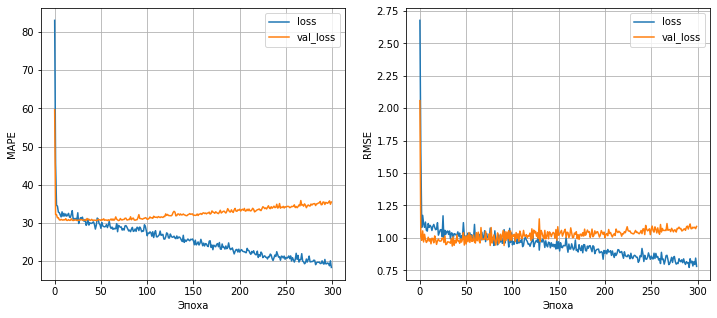

In [208]:
plot_loss(history_3.history)

In [209]:
# точность нейросети на тестовых данных
model_3.evaluate(X_test_nw, y_test_nw)

9/9 [==============================] - 0s 2ms/step - loss: 31.6429 - root_mean_squared_error: 1.0257


[31.642932891845703, 1.025729775428772]

In [210]:
# предсказание 
y_pred_keras3 = model_3.predict(X_test_nw)

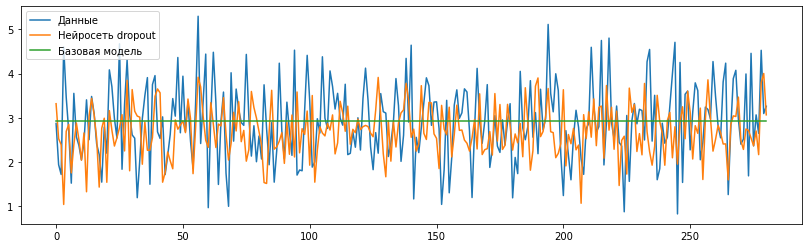

In [211]:
fig, ax = plt.subplots(figsize=(14, 4))
ax.plot(y_test_nw, label='Данные')
ax.plot(y_pred_keras3, label='Нейросеть dropout')
ax.plot(y_pred_base, label='Базовая модель')
ax.legend()
plt.show()

In [212]:
original_3 = y_test_nw
predicted_3 = y_pred_keras3

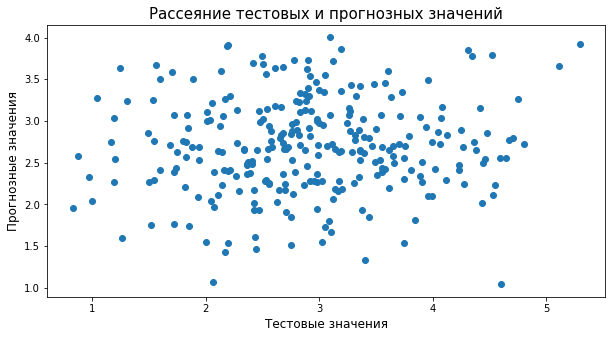

In [213]:
actual_and_predicted_scatter(original_3, predicted_3)

In [214]:
def get_metrics(model_name, y, y_pred):
    stat = pd.DataFrame()
    stat.loc[model_name, 'R2'] = metrics.r2_score(y, y_pred)
    stat.loc[model_name, 'RMSE'] = metrics.mean_squared_error(y, y_pred, squared=False) * -1
    stat.loc[model_name, 'MAE'] = metrics.mean_absolute_error(y, y_pred) * -1
    stat.loc[model_name, 'MAPE'] = metrics.mean_absolute_percentage_error(y, y_pred) * -1
    stat.loc[model_name, 'max_error'] = metrics.max_error(y, y_pred) * -1
    return stat

In [215]:
# сравнение предсказаний базовой модели и лучшей модели на тестовом множестве
compare = get_metrics('DummyRegressor', y_test_nw, y_pred_base)
compare = compare.append(get_metrics('Нейросеть переобученная', y_test_nw, y_pred_keras1))
compare = compare.append(get_metrics('Нейросеть с ранней остановкой', y_test_nw, y_pred_keras2))
compare = compare.append(get_metrics('Нейросеть dropout', y_test_nw, y_pred_keras3))
compare

,R2,RMSE,MAE,MAPE,max_error
DummyRegressor,-0.001569,-0.873433,-0.694175,-0.298186,-2.359781
Нейросеть переобученная,-0.778836,-1.164011,-0.928316,-0.368104,-3.836049
Нейросеть с ранней остановкой,-0.127695,-0.926798,-0.751660,-0.282948,-2.410464
Нейросеть dropout,-0.381299,-1.025730,-0.816692,-0.316429,-3.561940


# 6. Оценка моделей на тренировочной и тестовой выборках

## 6.1 Лучшая модель по параметру модуль упругости при растяжении - Случайный лес

In [216]:
result1 = pd.DataFrame()
y1_pred_train = rf_best_upr.predict(X_train_upr)
result1 = pd.concat([result1, get_metrics('Модуль упругости при растяжении, тренировочный', y_train_upr, y1_pred_train)])
y1_pred_test = rf_best_upr.predict(X_test_upr)
result1 = pd.concat([result1, get_metrics('Модуль упругости при растяжении, тестовый', y_test_upr, y1_pred_test)])
result1

,R2,RMSE,MAE,MAPE,max_error
"Модуль упругости при растяжении, тренировочный",0.011929,-0.192269,-0.154746,-3.382084e+12,-0.517673
"Модуль упругости при растяжении, тестовый",-0.001151,-0.186190,-0.150828,-4.486452e-01,-0.500318


## 6.2 Лучшая модель по параметру прочность при растяжении - K ближайших соседей

In [217]:
result2 = pd.DataFrame()
y2_pred_train = kn_best_pr.predict(X_train_pr)
result2 = pd.concat([result2, get_metrics('Прочность при растяжении, тренировочный', y_train_pr, y2_pred_train)])
y2_pred_test = kn_best_pr.predict(X_test_pr)
result2 = pd.concat([result2, get_metrics('Прочность при растяжении, тестовый', y_test_pr, y2_pred_test)])
result2

,R2,RMSE,MAE,MAPE,max_error
"Прочность при растяжении, тренировочный",0.006495,-0.189430,-0.151106,-3.387012e+12,-0.508566
"Прочность при растяжении, тестовый",-0.027995,-0.186562,-0.146584,-4.724052e-01,-0.496947


## 6.3 Лучшая нейросеть - с ранней остановкой (model2)


In [218]:
result3 = pd.DataFrame()
y3_pred_train = model_2.predict(X_train_nw)
result3 = pd.concat([result3, get_metrics('Соотношение матрица-наполнитель, тренировочный', y_train_nw, y3_pred_train)])
y3_pred_test = model_2.predict(X_test_nw)
result3 = pd.concat([result3, get_metrics('Соотношение матрица-наполнитель, тестовый', y_test_nw, y3_pred_test)])
result3

,R2,RMSE,MAE,MAPE,max_error
"Соотношение матрица-наполнитель, тренировочный",-0.116392,-0.952711,-0.76551,-0.294564,-2.989776
"Соотношение матрица-наполнитель, тестовый",-0.127695,-0.926798,-0.75166,-0.282948,-2.410464


# 7. Сохранение моделей

Для использования в приложении обученных моделей их надо сохранить.

In [222]:
# случайный лес для модуля упруности, к-ближайших соседей для прочности и нейронная сеть с остановкой
pickle.dump(rf_best_upr, open('rfr_model.pkl', 'wb'))
pickle.dump(kn_best_pr, open('knb_model.pkl', 'wb'))
pickle.dump(model_2, open('net_model_2.pkl', 'wb'))

INFO:tensorflow:Assets written to: ram://c6655d64-7482-4b05-a836-678dbecc6055/assets
